## Please use Google Colab for running the program

## Importing the neccessary libraries

In [1]:
import pandas as pd                               #reading, writing and manipulating the data (using tables)
import numpy as np                                #Library for linear algebra and some probabiltity (raw data) 
import tensorflow as tf                           #library for numerical computation that makes machine learning faster and easier
from tensorflow import keras                      #we may not add this since keras is already thier in tensorflow
from tensorflow.keras.models import Sequential    #To create the sequential layer
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D,Dropout  #To create the model
from tensorflow.keras.optimizers import Adam      #Adam optimizer
from keras.preprocessing import image             #used for image classification
from keras.preprocessing.image import ImageDataGenerator  #used to expand the training dataset in order to improve the performance and ability of the model to generalize
import matplotlib.pyplot as plt                   #library to plot graphs
from google.colab import files                    #To be able to upload files

## Mounting Google Drive where I uploaded the given dataset folder


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Unzipping the dataset.zip to get the 2 seperate folders train_validate and test

In [3]:
!unzip /content/drive/MyDrive/dataset.zip

Archive:  /content/drive/MyDrive/dataset.zip
  inflating: dataset/train_validate/unmasked/27.jpg  
  inflating: dataset/train_validate/masked/with_mask424.jpg  
  inflating: dataset/train_validate/masked/with_mask432.jpg  
  inflating: dataset/train_validate/unmasked/32.jpg  
  inflating: dataset/test/masked/with_mask447.jpg  
  inflating: dataset/test/masked/with_mask446.jpg  
  inflating: dataset/train_validate/masked/with_mask431.JPG  
  inflating: dataset/train_validate/masked/with_mask428.jpg  
  inflating: dataset/train_validate/masked/with_mask422.jpg  
  inflating: dataset/train_validate/masked/with_mask425.jpg  
  inflating: dataset/train_validate/masked/with_mask413.jpg  
  inflating: dataset/train_validate/masked/with_mask410.jpg  
  inflating: dataset/train_validate/unmasked/61.jpg  
  inflating: dataset/train_validate/masked/with_mask429.jpg  
  inflating: dataset/train_validate/masked/with_mask418.jpg  
  inflating: dataset/train_validate/masked/with_mask421.jpeg  
  infl

## Setting batch size as 32 and epochs to 70

In [4]:
batch_size = 32
epochs = 70

## Setting directory folder for ImageDataGenerator

In [5]:
directory = '/content/dataset/train_validate'

## Using ImageDataGenerator for creating Train and Validation Data

In [6]:
train_datagen = ImageDataGenerator(validation_split=0.2,        # Splits the data into training (80%) and validation (20%)
                                   rescale = 1./255,            # Multiple the colors by a number between 0-1 to process data faster
                                   rotation_range=40,           #rotate the images
                                   width_shift_range=0.2,     
                                   height_shift_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')        #add new pixels when the image is rotated or shifted

## Creating Train data with labels for masked and unmasked based on which folders it finds the images

In [7]:
train_generator = train_datagen.flow_from_directory(
                                directory,
                                target_size = (64, 64),
                                batch_size = batch_size,
                                color_mode="rgb",               # for coloured images
                                class_mode = 'categorical',
                                seed=2020,                      # to make the result reproducible
                                subset = 'training') 

Found 1382 images belonging to 2 classes.


## Creating Validation data with labels for masked and unmasked based on which folders it finds the images

In [8]:
validation_generator = train_datagen.flow_from_directory(
                                directory,
                                target_size = (64, 64),
                                batch_size = batch_size,
                                color_mode="rgb",               # for coloured images
                                class_mode = 'categorical',
                                subset = 'validation')            # Specify this is training set

Found 345 images belonging to 2 classes.


## Getting the Train Data Images and Labels of Masked or Unmasked from Train Generator

In [9]:
imgs, labels = next(train_generator)

## Defining function to plot Train data images and labels

In [10]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, batch_size, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## Plotting Train Data Images and labels for one sample
## Masked label - 0 
## Unmasked label - 1


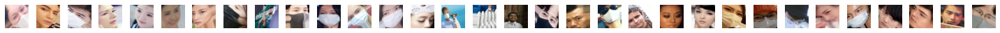

[[1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]]


In [11]:
plotImages(imgs);
print(labels);

**DEFAULT CNN MODEL**

Using Softmax classifier

conv --> A --> pool -->
(conv --> A) --> (conv --> A) --> pool -->
full connected layer --> A -->
softmax classifier





In [12]:
model = Sequential([
                    Conv2D(filters=32, kernel_size=(3,3),activation='relu',padding='same',input_shape=(64,64,3)),
                    MaxPool2D(pool_size=(2,2), strides=2),
                    Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding= 'same'),
                    Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding= 'same'),
                    MaxPool2D(pool_size=(2,2), strides =2),
                    Flatten(),
                    Dense(units=64, activation= 'relu'),
                    #means the output is 0,1 (the labels) and the P(c=0) +P(c=1) = 1 
                    Dense(units=2, activation='softmax'), 

])


## Printing Model Summary

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 32, 32, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 16, 16, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 16384)             0

## Compiling the Default Model

In [14]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

## Fitting Model and saving train_loss, train_acc, validation_loss, validation_acc for each epoch 

In [15]:
history = model.fit(train_generator ,epochs = epochs,validation_data= validation_generator)

Epoch 1/70
44/44 [==============================] - 16s 353ms/step - loss: 0.6505 - accuracy: 0.6491 - val_loss: 0.5593 - val_accuracy: 0.8029
Epoch 2/70
44/44 [==============================] - 15s 334ms/step - loss: 0.4548 - accuracy: 0.8343 - val_loss: 0.3762 - val_accuracy: 0.8551
Epoch 3/70
44/44 [==============================] - 15s 339ms/step - loss: 0.3543 - accuracy: 0.8611 - val_loss: 0.3083 - val_accuracy: 0.8928
Epoch 4/70
44/44 [==============================] - 15s 340ms/step - loss: 0.3233 - accuracy: 0.8676 - val_loss: 0.3003 - val_accuracy: 0.8986
Epoch 5/70
44/44 [==============================] - 16s 363ms/step - loss: 0.2954 - accuracy: 0.8886 - val_loss: 0.3228 - val_accuracy: 0.8725
Epoch 6/70
44/44 [==============================] - 15s 340ms/step - loss: 0.3008 - accuracy: 0.8835 - val_loss: 0.3707 - val_accuracy: 0.8435
Epoch 7/70
44/44 [==============================] - 15s 341ms/step - loss: 0.2940 - accuracy: 0.8792 - val_loss: 0.2471 - val_accuracy: 0.8957

## Plotting Default Model Training Loss and Validation Loss against 70 Epochs

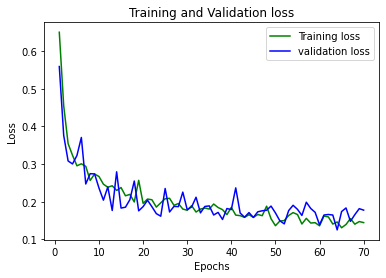

In [16]:
loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochstoplot = range(1,epochs+1)
plt.plot(epochstoplot, loss_train, 'g', label='Training loss')
plt.plot(epochstoplot, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Plotting Default Model Training and Validation Accuracy against the 70 Epochs

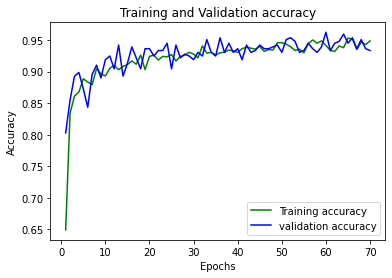

In [17]:
accur_train = history.history['accuracy']
accur_val = history.history['val_accuracy']
plt.plot(epochstoplot, accur_train, 'g', label='Training accuracy')
plt.plot(epochstoplot, accur_val, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Default Model Training Loss and Accuracy

In [18]:
print('Final training loss \t', history.history['loss'][-1])
print('Final training accuracy ', history.history['accuracy'][-1])

Final training loss 	 0.14437758922576904
Final training accuracy  0.9486252069473267


## Setting Directory for Test Data

In [19]:
directory_test = '/content/dataset/test'

## Creating Test Data using ImageDataGenerator

In [21]:
desired_batch_size=32

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        directory_test,
        target_size = (64, 64),
        color_mode="rgb",
        shuffle = False,
        class_mode='categorical',
        batch_size=desired_batch_size)

filenames = test_generator.filenames
nb_samples = len(filenames)


predict = model.predict_generator(test_generator)

Found 320 images belonging to 2 classes.


<ipython-input-21-30837264faf2>:17: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predict = model.predict_generator(test_generator)


In [22]:
predicted_classes = np.argmax(predict, axis=1)

In [23]:
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  

## Classification Report and Confusion Matrix for Default Model

In [24]:
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(true_classes, predicted_classes, target_names=class_labels))
print(confusion_matrix(true_classes, predicted_classes))


              precision    recall  f1-score   support

      masked       0.77      0.83      0.80       160
    unmasked       0.82      0.75      0.78       160

    accuracy                           0.79       320
   macro avg       0.79      0.79      0.79       320
weighted avg       0.79      0.79      0.79       320

[[133  27]
 [ 40 120]]


In [25]:
from sklearn.metrics import precision_score
m1_precision_score = precision_score(true_classes, predicted_classes, average=None)
print(m1_precision_score)

[0.76878613 0.81632653]


In [26]:
from sklearn.metrics import recall_score
m1_recall_score = recall_score(true_classes, predicted_classes, average=None)
print(m1_recall_score)

[0.83125 0.75   ]


In [27]:
scoreSeg = model.evaluate(test_generator,steps = np.ceil(nb_samples/desired_batch_size))

10/10 [==============================] - 1s 112ms/step - loss: 0.5317 - accuracy: 0.7906


## Test Loss and Accuracy for Default Model

In [30]:
print('Testing loss \t', scoreSeg[0])
print('Testing accuracy ', scoreSeg[1])

Testing loss 	 0.5316972136497498
Testing accuracy  0.7906249761581421


## Testing Defaulting Model with Masked Test Images and Displaying result as Masked or Unmasked using the Default Model

In [49]:
import os     
directory = '/content/dataset/test/masked'

1/1 [==============================] - 0s 20ms/step


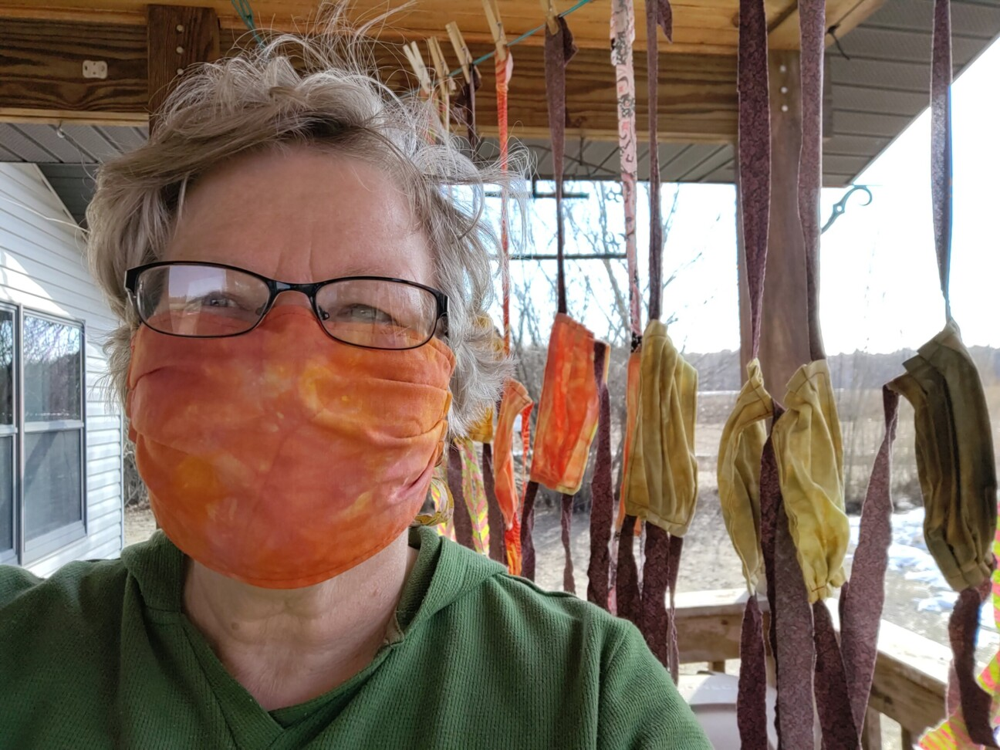



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


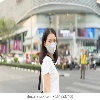



The person is wearing a mask. 

1/1 [==============================] - 0s 20ms/step


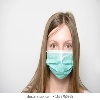



The person is not wearing a mask.

1/1 [==============================] - 0s 23ms/step


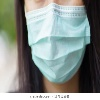



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


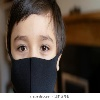



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


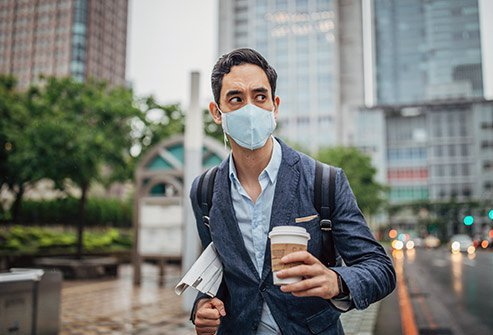



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


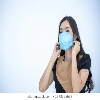



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


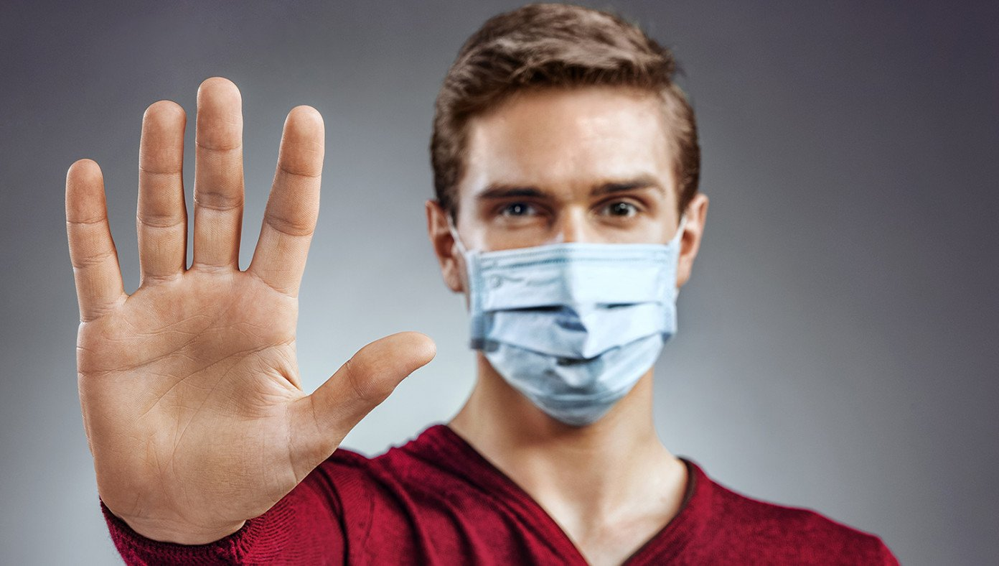



The person is not wearing a mask.

1/1 [==============================] - 0s 19ms/step


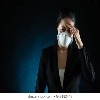



The person is not wearing a mask.

1/1 [==============================] - 0s 21ms/step


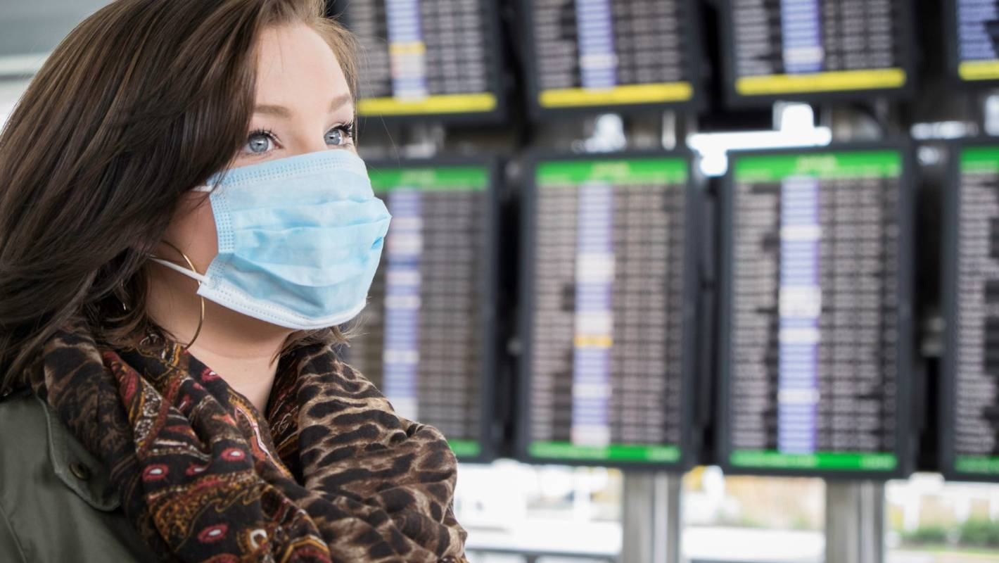



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


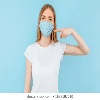



The person is not wearing a mask.

1/1 [==============================] - 0s 44ms/step


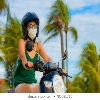



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


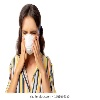



The person is wearing a mask. 

1/1 [==============================] - 0s 23ms/step


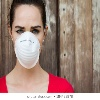



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


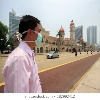



The person is wearing a mask. 

1/1 [==============================] - 0s 22ms/step


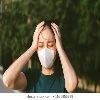



The person is not wearing a mask.

1/1 [==============================] - 0s 24ms/step


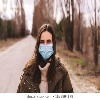



The person is not wearing a mask.

1/1 [==============================] - 0s 21ms/step


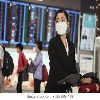



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


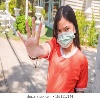



The person is wearing a mask. 

1/1 [==============================] - 0s 20ms/step


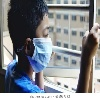



The person is not wearing a mask.

1/1 [==============================] - 0s 21ms/step


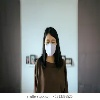



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


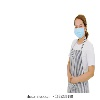



The person is wearing a mask. 

1/1 [==============================] - 0s 25ms/step


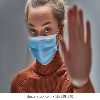



The person is wearing a mask. 

1/1 [==============================] - 0s 21ms/step


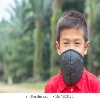



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


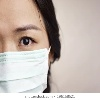



The person is not wearing a mask.

1/1 [==============================] - 0s 25ms/step


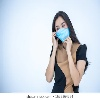



The person is wearing a mask. 

1/1 [==============================] - 0s 38ms/step


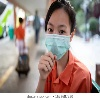



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


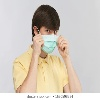



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


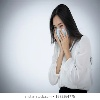



The person is wearing a mask. 

1/1 [==============================] - 0s 23ms/step


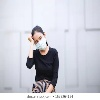



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


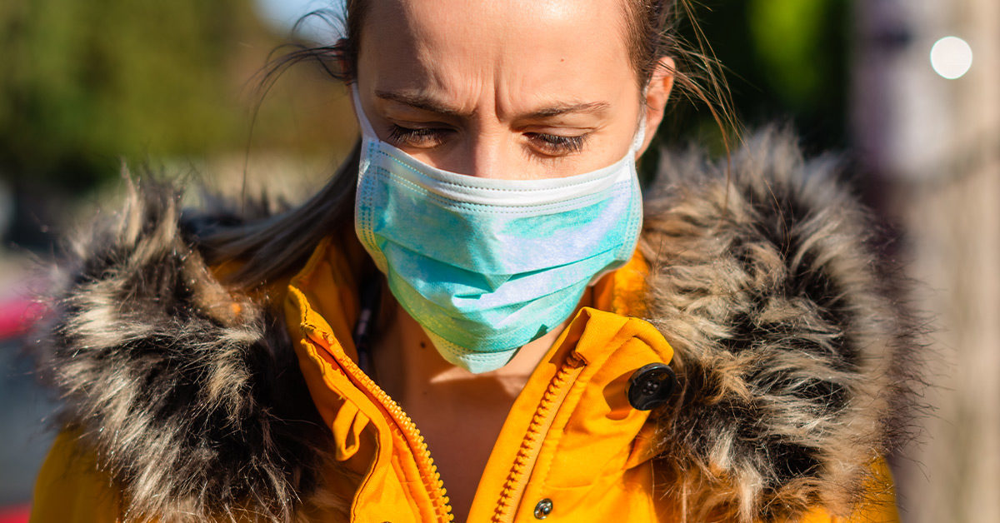



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


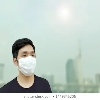



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


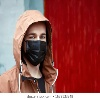



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


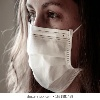



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


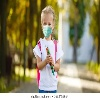



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


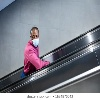



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


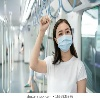



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


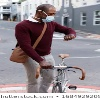



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


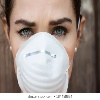



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


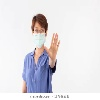



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


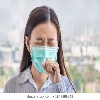



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


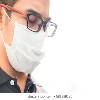



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


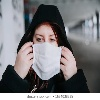



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


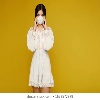



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


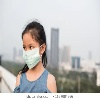



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


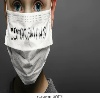



The person is wearing a mask. 

1/1 [==============================] - 0s 38ms/step


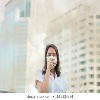



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


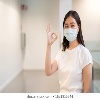



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


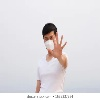



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


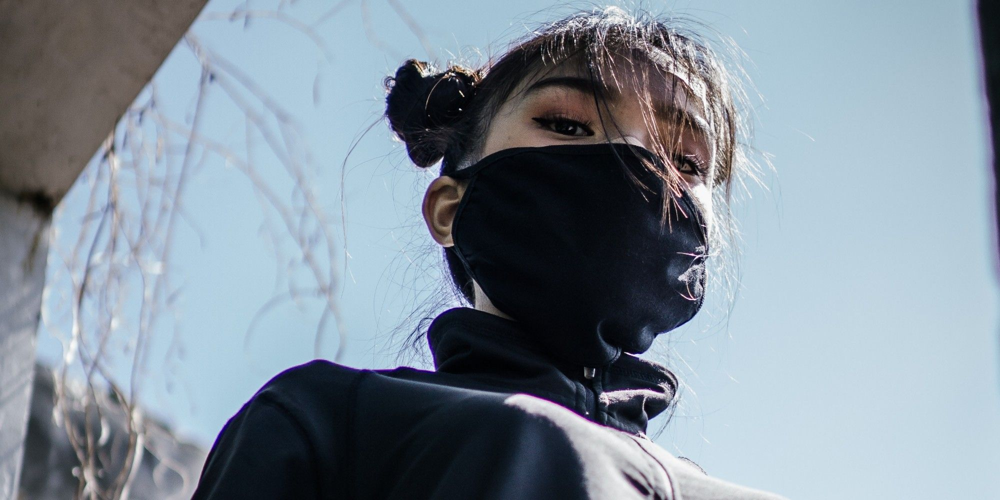



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


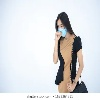



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


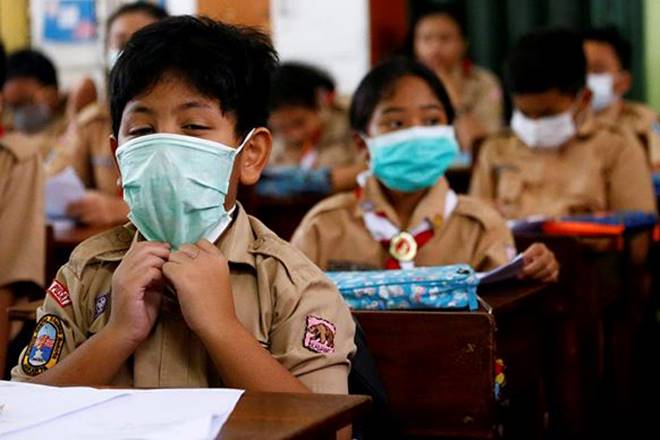



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


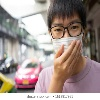



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


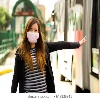



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


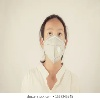



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


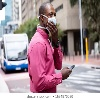



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


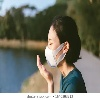



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


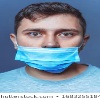



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


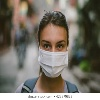



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


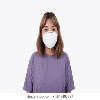



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


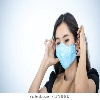



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


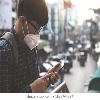



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


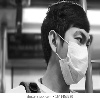



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


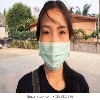



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


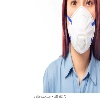



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


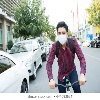



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


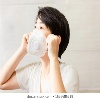



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


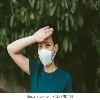



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


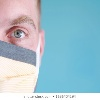



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


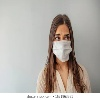



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


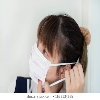



The person is wearing a mask. 

1/1 [==============================] - 0s 40ms/step


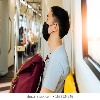



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


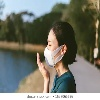



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


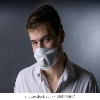



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


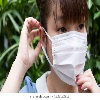



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


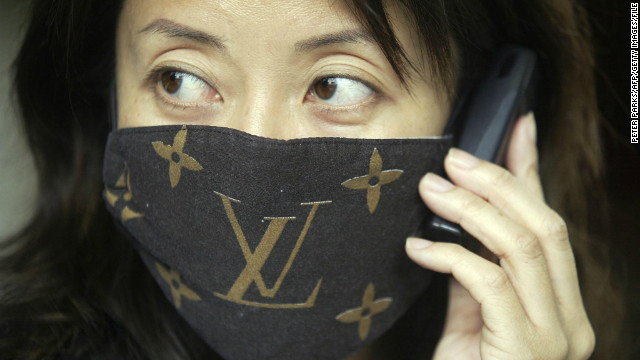



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


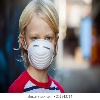



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


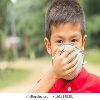



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


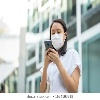



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


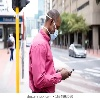



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


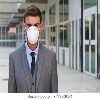



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


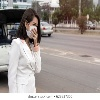



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


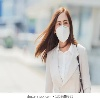



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


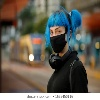



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


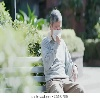



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


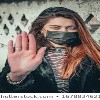



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


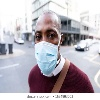



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


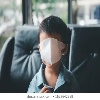



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


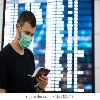



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


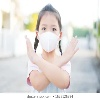



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


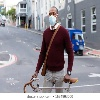



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


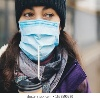



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


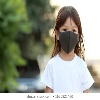



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


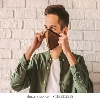



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


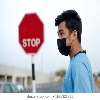



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


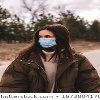



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


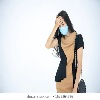



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


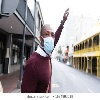



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


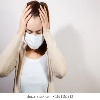



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


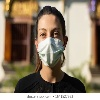



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


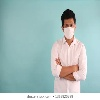



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


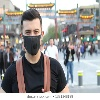



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


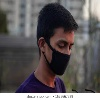



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


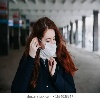



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


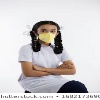



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


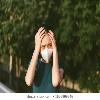



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


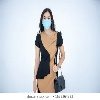



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


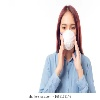



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


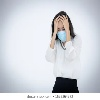



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


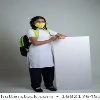



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


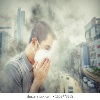



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


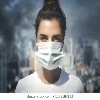



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


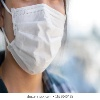



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


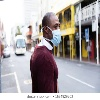



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


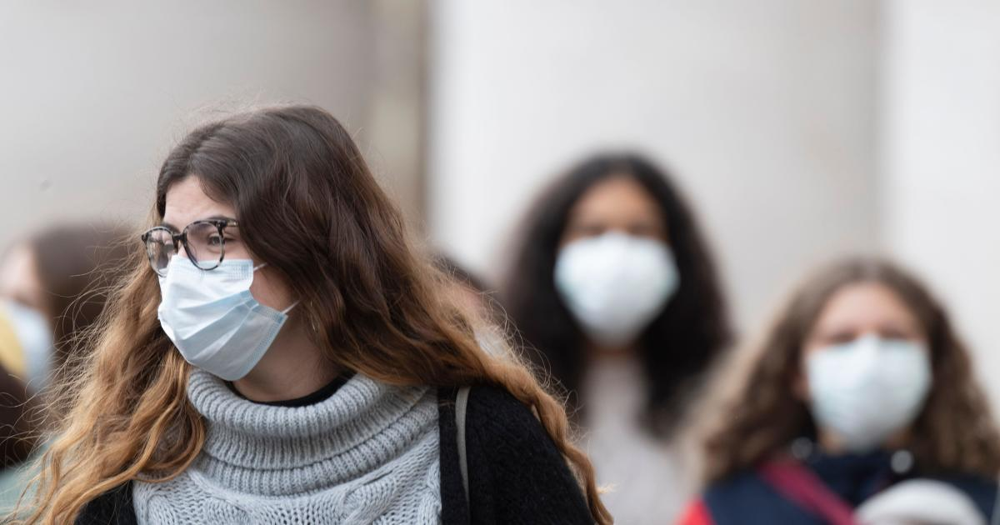



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


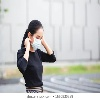



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


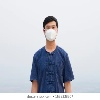



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


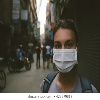



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


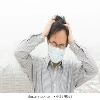



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


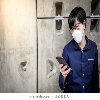



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


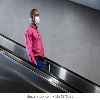



The person is not wearing a mask.

1/1 [==============================] - 0s 38ms/step


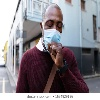



The person is wearing a mask. 

1/1 [==============================] - 0s 50ms/step


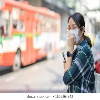



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


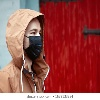



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


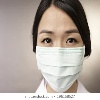



The person is not wearing a mask.

1/1 [==============================] - 0s 40ms/step


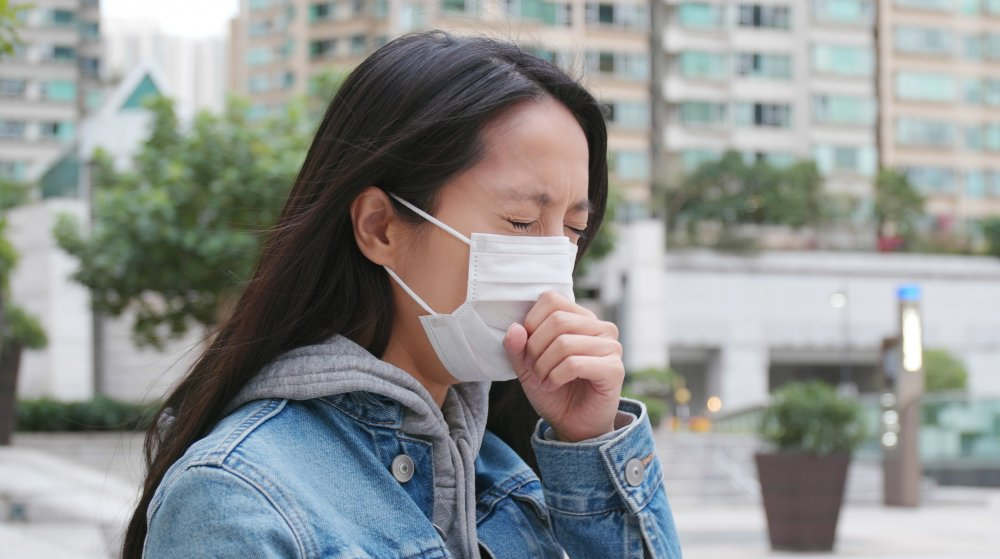



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


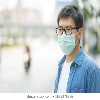



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


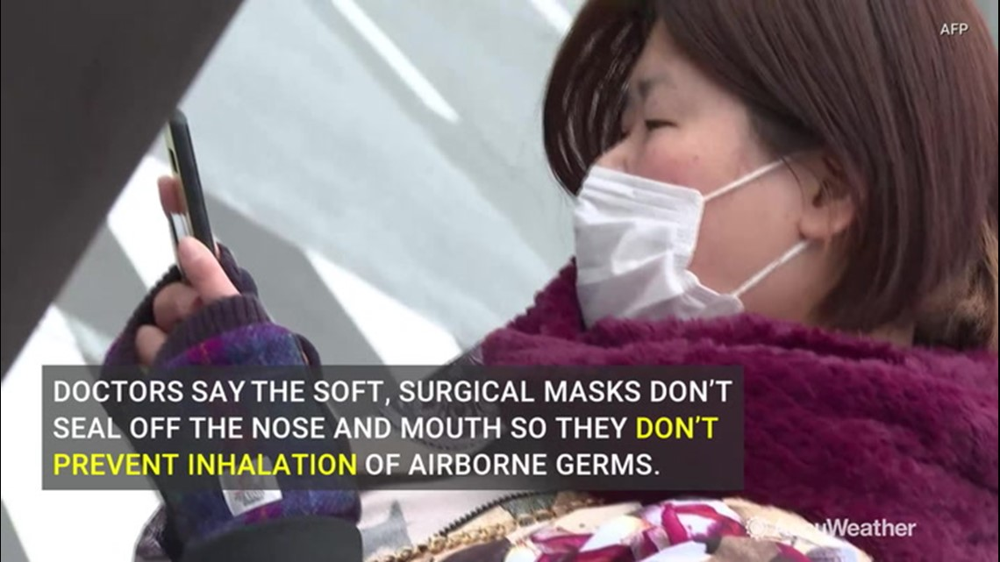



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


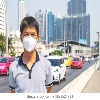



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


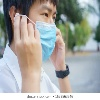



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


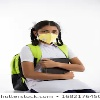



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


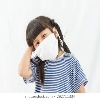



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


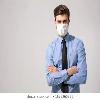



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


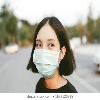



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


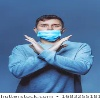



The person is not wearing a mask.

1/1 [==============================] - 0s 42ms/step


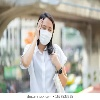



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


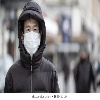



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


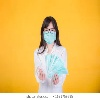



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


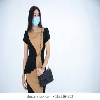



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


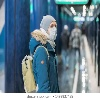



The person is not wearing a mask.

1/1 [==============================] - 0s 37ms/step


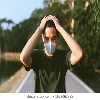



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


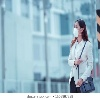



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


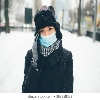



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


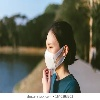



The person is wearing a mask. 

1/1 [==============================] - 0s 35ms/step


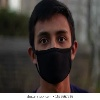



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


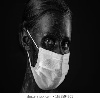



The person is wearing a mask. 

1/1 [==============================] - 0s 41ms/step


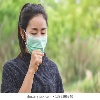



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


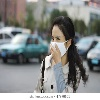



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


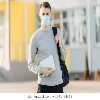



The person is wearing a mask. 

1/1 [==============================] - 0s 35ms/step


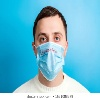



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


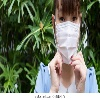



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


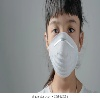



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


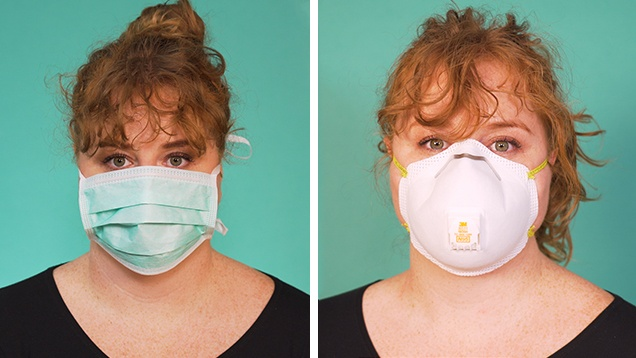



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


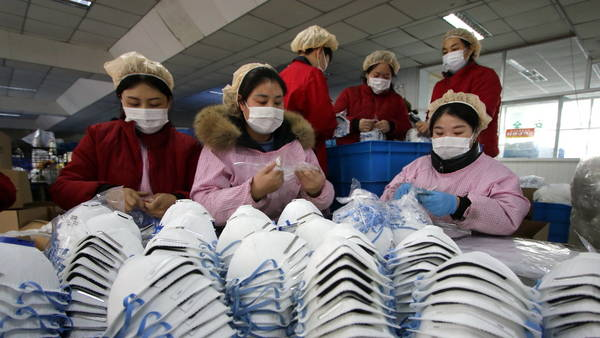



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


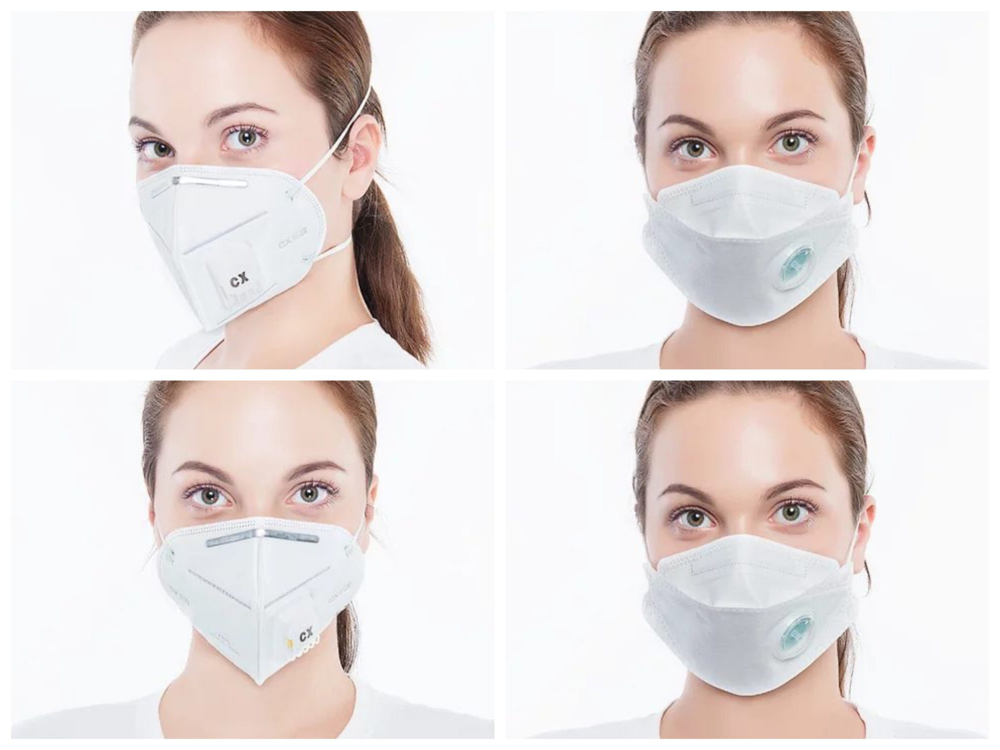



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


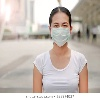



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


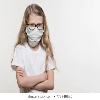



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


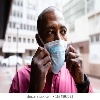



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


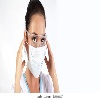



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


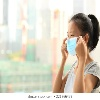



The person is wearing a mask. 



In [50]:
#from tensorflow.keras.utils import load_img, img_to_array
from IPython.display import Image, display
TGREEN =  '\033[1;37;42m'
TRED =    '\033[1;37;41m'
for filename in os.listdir(directory):
  img_directory1 = directory + '/' + filename
  #img_directory1 = filename
  img_pred1 = keras.utils.load_img(img_directory1, target_size = (64, 64))
  img_pred1 = keras.utils.img_to_array(img_pred1)
  img_pred1 = np.expand_dims(img_pred1, axis = 0)

  prediction1 = model.predict(img_pred1)
  display(Image(img_directory1,width= 150, height=150))
  print("\n")
  if(int(prediction1[0][0]) == 0):
    print(TGREEN + "The person is wearing a mask. \n")
  else:
    print(TRED + "The person is not wearing a mask.\n")


## Testing Defaulting Model with UnMasked Test Images and Displaying result as Masked or Unmasked using the Default Model

In [52]:
import os
directory2 = '/content/dataset/test/unmasked'

In [ ]:
for filename2 in os.listdir(directory2):
  img_directory2 = directory2 + '/' + filename2
  img_pred2 = keras.utils.load_img(img_directory2, target_size = (64, 64))
  img_pred2 = keras.utils.img_to_array(img_pred2)
  img_pred2 = np.expand_dims(img_pred2, axis = 0)

  prediction2 = model.predict(img_pred2)
  prediction2 = np.argmax(prediction2, axis=1)
  display(Image(img_directory2,width= 150, height=150))
  print("\n")
  if(prediction2 == 0):
    print(TGREEN + "The person is wearing a mask. \n")
  else:
    print(TRED + "The person is not wearing a mask.\n")


## **Improved Model**
conv --> A --> pool-->
(conv --> A) --> pool-->
(conv --> A) --> pool-->
(conv --> A) --> pool-->
full connected layer --> A
softmax classifier

In [55]:
model2 = Sequential([
                    Conv2D(filters=32, kernel_size=(3,3),activation='relu',padding='same',input_shape=(64,64,3)),
                    MaxPool2D(pool_size=(2,2), strides=2),
                    Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding= 'same'),
                    MaxPool2D(pool_size=(2,2), strides =2),
                    Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding= 'same'),
                    MaxPool2D(pool_size=(2,2), strides =2),
                    Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding= 'same'),  #extra layer of convolution
                    MaxPool2D(pool_size=(2,2), strides =2),                                     #extra layer of Max Pool 
                    Flatten(),
                    Dense(units=64, activation= 'relu'),
                    #means the output is 0,1 (the labels) and the P(c=0) +P(c=1) = 1 
                    Dense(units=2, activation='softmax'), 

])


## Printing Improved Model Summary

In [56]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 64, 64, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 8, 8, 64)        

## Compiling the Model2

In [57]:
model2.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

## Fitting Model2 and saving train_loss, train_acc, validation_loss, validation_acc for each epoch 

In [58]:
history2 = model2.fit(train_generator ,epochs = epochs,validation_data= validation_generator)

Epoch 1/70
44/44 [==============================] - 14s 294ms/step - loss: 0.6848 - accuracy: 0.6129 - val_loss: 0.6716 - val_accuracy: 0.7507
Epoch 2/70
44/44 [==============================] - 12s 279ms/step - loss: 0.6246 - accuracy: 0.7634 - val_loss: 0.5321 - val_accuracy: 0.8319
Epoch 3/70
44/44 [==============================] - 12s 281ms/step - loss: 0.4490 - accuracy: 0.8300 - val_loss: 0.4789 - val_accuracy: 0.7855
Epoch 4/70
44/44 [==============================] - 12s 280ms/step - loss: 0.3533 - accuracy: 0.8495 - val_loss: 0.3406 - val_accuracy: 0.8725
Epoch 5/70
44/44 [==============================] - 13s 285ms/step - loss: 0.3198 - accuracy: 0.8806 - val_loss: 0.3034 - val_accuracy: 0.8812
Epoch 6/70
44/44 [==============================] - 13s 284ms/step - loss: 0.3055 - accuracy: 0.8828 - val_loss: 0.2859 - val_accuracy: 0.8812
Epoch 7/70
44/44 [==============================] - 13s 283ms/step - loss: 0.2813 - accuracy: 0.8973 - val_loss: 0.2525 - val_accuracy: 0.9014

## Plotting Improved Model Training Loss and Validation Loss against 70 Epochs

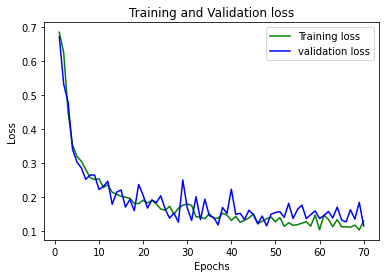

In [59]:
loss_train2 = history2.history['loss']
loss_val2 = history2.history['val_loss']
epochstoplot = range(1,epochs+1)
plt.plot(epochstoplot, loss_train2, 'g', label='Training loss')
plt.plot(epochstoplot, loss_val2, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Plotting Improved Model Training and Validation Accuracy against the 70 Epochs

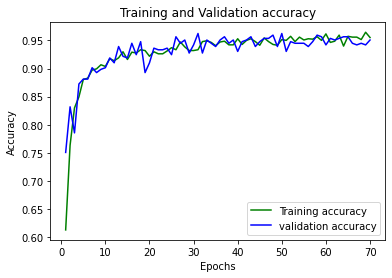

In [60]:
accur_train2 = history2.history['accuracy']
accur_val2 = history2.history['val_accuracy']
plt.plot(epochstoplot, accur_train2, 'g', label='Training accuracy')
plt.plot(epochstoplot, accur_val2, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Training Loss and Accuracy for Improved Model

In [61]:
print('Final training loss \t', history2.history['loss'][-1])
print('Final training accuracy ', history2.history['accuracy'][-1])

Final training loss 	 0.13001765310764313
Final training accuracy  0.9551374912261963


## Prediction for Improved Model

In [62]:
directory_test2 = '/content/dataset/test'


In [63]:
desired_batch_size2=32

test_datagen2 = ImageDataGenerator(rescale=1./255)
#test_datagen2 = ImageDataGenerator()

test_generator2 = test_datagen2.flow_from_directory(
        directory_test2,
        target_size = (64, 64),
        color_mode="rgb",
        shuffle = False,
        class_mode='categorical',
        batch_size=desired_batch_size2)

filenames2 = test_generator2.filenames
nb_samples2 = len(filenames2)

test_generator2.reset()

predict2 = model2.predict(test_generator2,steps = np.ceil(nb_samples2/desired_batch_size2))
#predict2 = model2.predict(test_generator2)

Found 320 images belonging to 2 classes.
10/10 [==============================] - 1s 100ms/step


In [64]:
predicted_classes2 = np.argmax(predict2, axis=1)

In [65]:
true_classes2 = test_generator2.classes
class_labels2 = list(test_generator2.class_indices.keys())  

## Classification Report and Confusion Matrix for Improved Model

In [66]:
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(true_classes2, predicted_classes2, target_names=class_labels2))
print(confusion_matrix(true_classes2, predicted_classes2))


              precision    recall  f1-score   support

      masked       0.84      0.89      0.86       160
    unmasked       0.88      0.83      0.86       160

    accuracy                           0.86       320
   macro avg       0.86      0.86      0.86       320
weighted avg       0.86      0.86      0.86       320

[[142  18]
 [ 27 133]]


In [67]:
from sklearn.metrics import precision_score
m2_precision_score = precision_score(true_classes2, predicted_classes2, average=None)
print(m2_precision_score)

[0.84023669 0.8807947 ]


In [68]:
from sklearn.metrics import recall_score
m2_recall_score = recall_score(true_classes2, predicted_classes2, average=None)
print(m2_recall_score)

[0.8875  0.83125]


In [69]:
scoreSeg2 = model2.evaluate(test_generator2,steps = np.ceil(nb_samples2/desired_batch_size2))

10/10 [==============================] - 1s 99ms/step - loss: 0.4111 - accuracy: 0.8594


## Test Loss and Accuracy for Improved Model

In [70]:
print('Testing loss \t', scoreSeg2[0])
print('Testing accuracy ', scoreSeg2[1])

Testing loss 	 0.4110730290412903
Testing accuracy  0.859375


## **Single Bar Plot of Precision and Recall of Default Model(M1) and Improved Model(M2)**

Default Model Accuracy  :  0.7906249761581421
Improved Model Accuracy :  0.859375
 


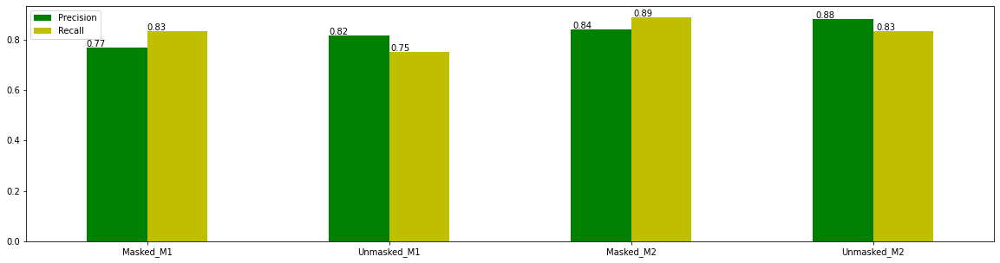

In [71]:
print("Default Model Accuracy  : ",scoreSeg[1])
print("Improved Model Accuracy : ",scoreSeg2[1])
print(" ")
precision_score = [m1_precision_score[0],m1_precision_score[1],m2_precision_score[0],m2_precision_score[1]]
recall_score = [m1_recall_score[0],m1_recall_score[1],m2_recall_score[0],m2_recall_score[1]]
index = ['Masked_M1','Unmasked_M1','Masked_M2','Unmasked_M2']
df = pd.DataFrame({'Precision': precision_score,
                   'Recall': recall_score}, index=index)
#ax = df.plot.bar(rot=0)
ax = df.plot.bar(rot=0,fontsize=10,figsize=(20,5),color=tuple(["g", "y"]))
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),2)), (p.get_x() * 1.005, p.get_height() * 1.005),)

## Testing Improved Model with Masked Test Images and Displaying result as Masked or Unmasked

In [72]:
import os     
directory4 = '/content/dataset/test/masked'

1/1 [==============================] - 0s 79ms/step


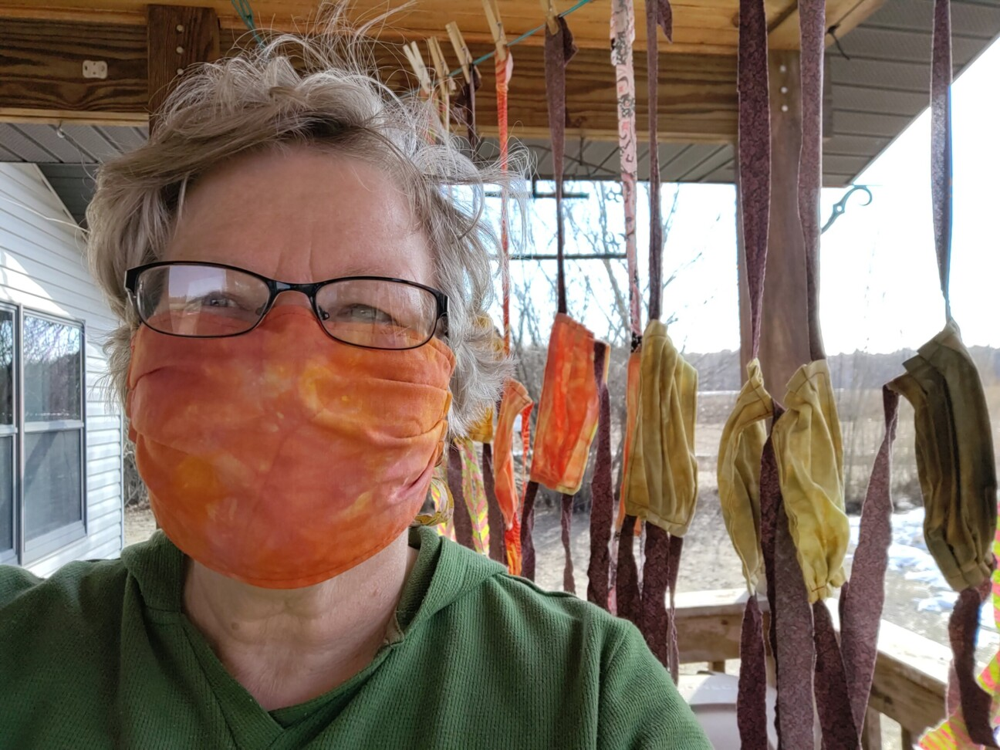



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


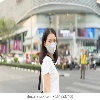



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


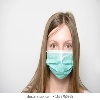



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


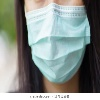



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


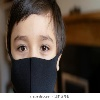



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


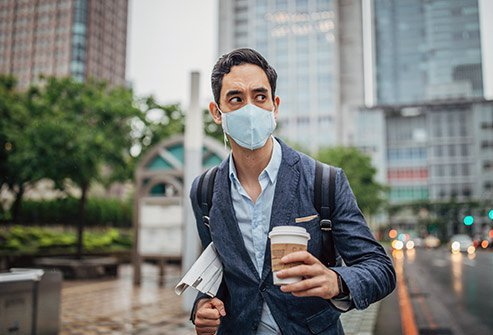



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


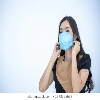



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


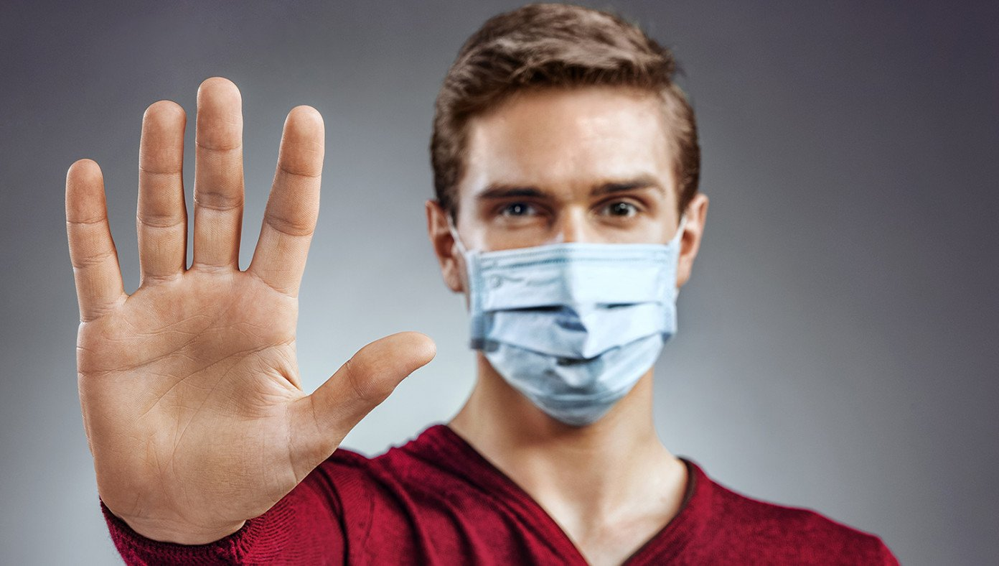



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


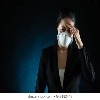



The person is wearing a mask. 

1/1 [==============================] - 0s 39ms/step


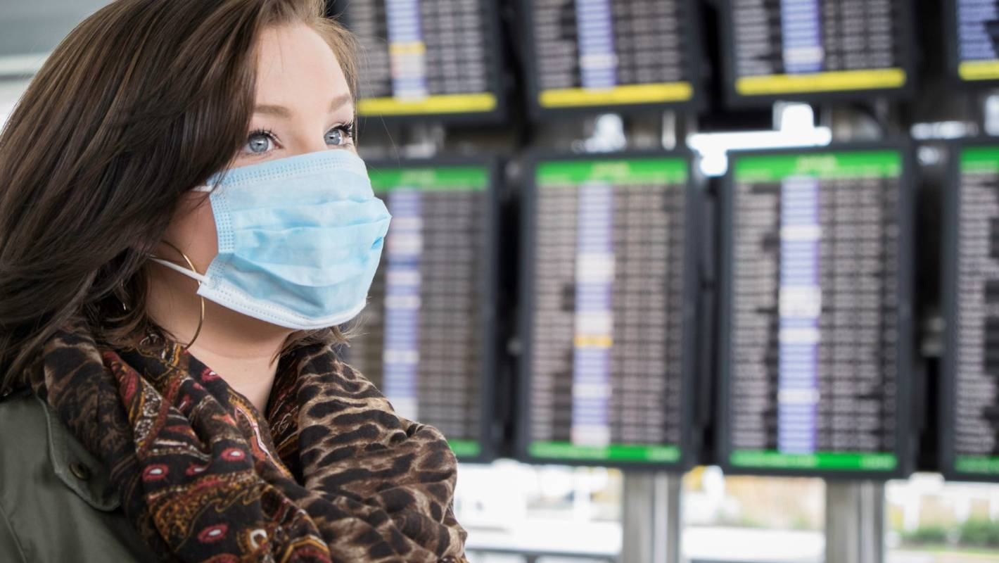



The person is wearing a mask. 

1/1 [==============================] - 0s 45ms/step


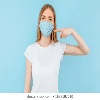



The person is wearing a mask. 

1/1 [==============================] - 0s 44ms/step


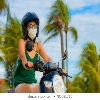



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


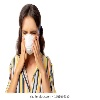



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


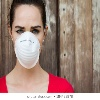



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


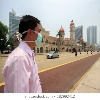



The person is not wearing a mask.

1/1 [==============================] - 0s 23ms/step


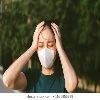



The person is wearing a mask. 

1/1 [==============================] - 0s 24ms/step


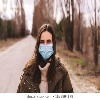



The person is wearing a mask. 

1/1 [==============================] - 0s 24ms/step


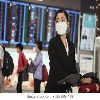



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


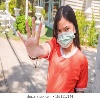



The person is not wearing a mask.

1/1 [==============================] - 0s 24ms/step


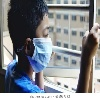



The person is wearing a mask. 

1/1 [==============================] - 0s 22ms/step


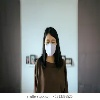



The person is wearing a mask. 

1/1 [==============================] - 0s 23ms/step


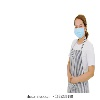



The person is not wearing a mask.

1/1 [==============================] - 0s 25ms/step


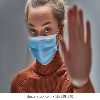



The person is wearing a mask. 

1/1 [==============================] - 0s 21ms/step


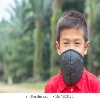



The person is wearing a mask. 

1/1 [==============================] - 0s 24ms/step


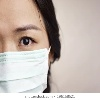



The person is wearing a mask. 

1/1 [==============================] - 0s 21ms/step


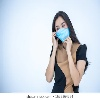



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


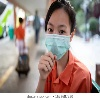



The person is wearing a mask. 

1/1 [==============================] - 0s 21ms/step


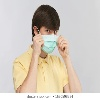



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


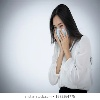



The person is wearing a mask. 

1/1 [==============================] - 0s 22ms/step


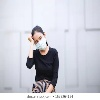



The person is wearing a mask. 

1/1 [==============================] - 0s 20ms/step


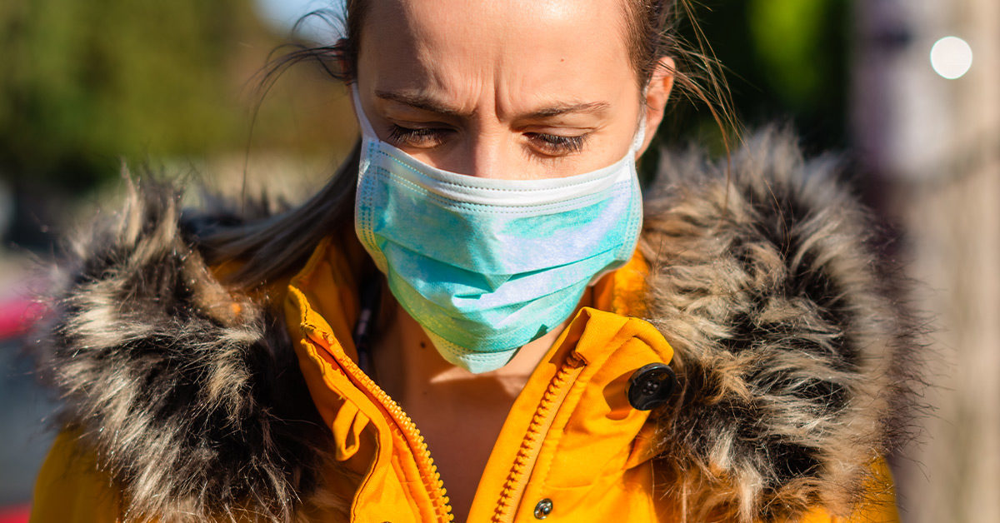



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


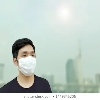



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


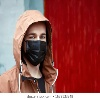



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


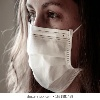



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


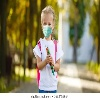



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


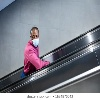



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


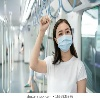



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


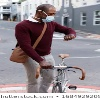



The person is wearing a mask. 

1/1 [==============================] - 0s 41ms/step


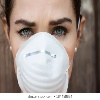



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


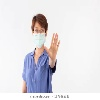



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


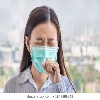



The person is wearing a mask. 

1/1 [==============================] - 0s 35ms/step


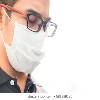



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


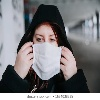



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


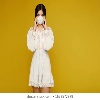



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


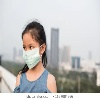



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


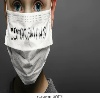



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


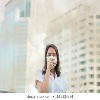



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


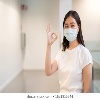



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


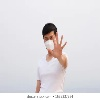



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


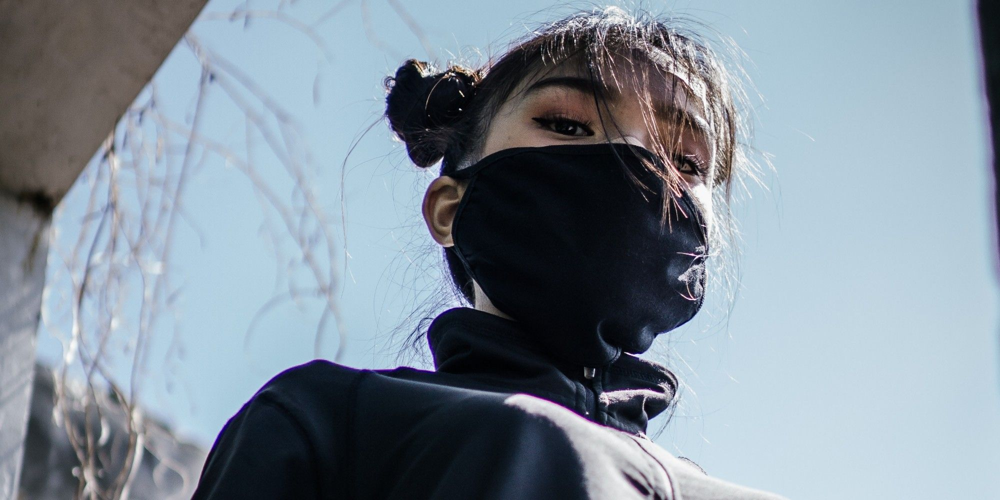



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


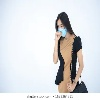



The person is not wearing a mask.

1/1 [==============================] - 0s 35ms/step


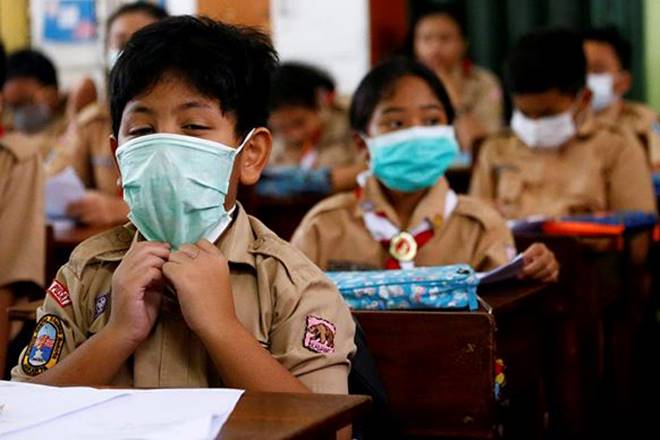



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


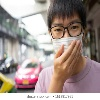



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


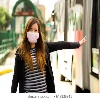



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


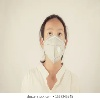



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


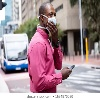



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


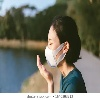



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


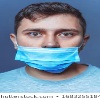



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


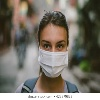



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


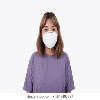



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


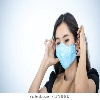



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


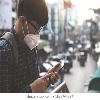



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


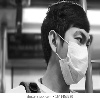



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


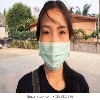



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


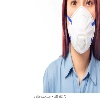



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


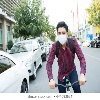



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


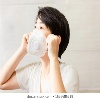



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


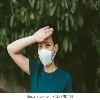



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


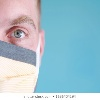



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


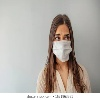



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


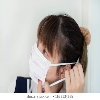



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


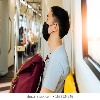



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


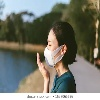



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


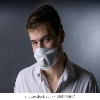



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


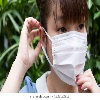



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


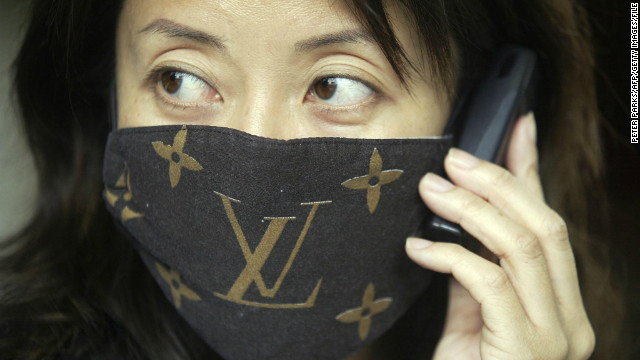



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


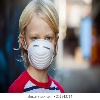



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


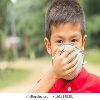



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


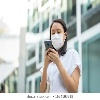



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


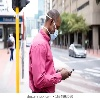



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


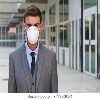



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


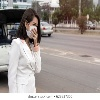



The person is wearing a mask. 

1/1 [==============================] - 0s 33ms/step


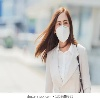



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


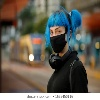



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


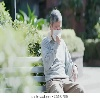



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


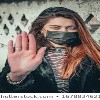



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


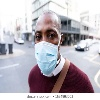



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


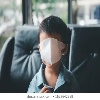



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


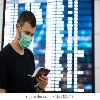



The person is wearing a mask. 

1/1 [==============================] - 0s 35ms/step


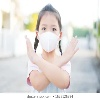



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


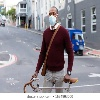



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


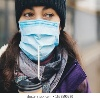



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


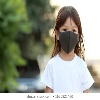



The person is wearing a mask. 

1/1 [==============================] - 0s 43ms/step


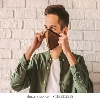



The person is wearing a mask. 

1/1 [==============================] - 0s 44ms/step


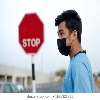



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


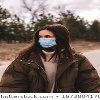



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


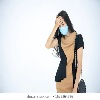



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


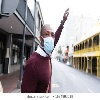



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


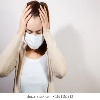



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


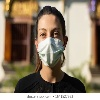



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


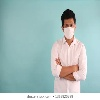



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


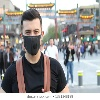



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


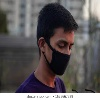



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


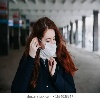



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


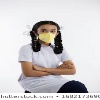



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


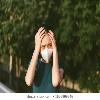



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


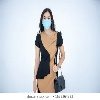



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


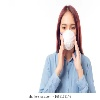



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


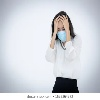



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


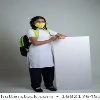



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


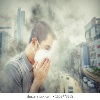



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


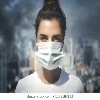



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


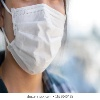



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


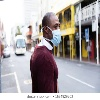



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


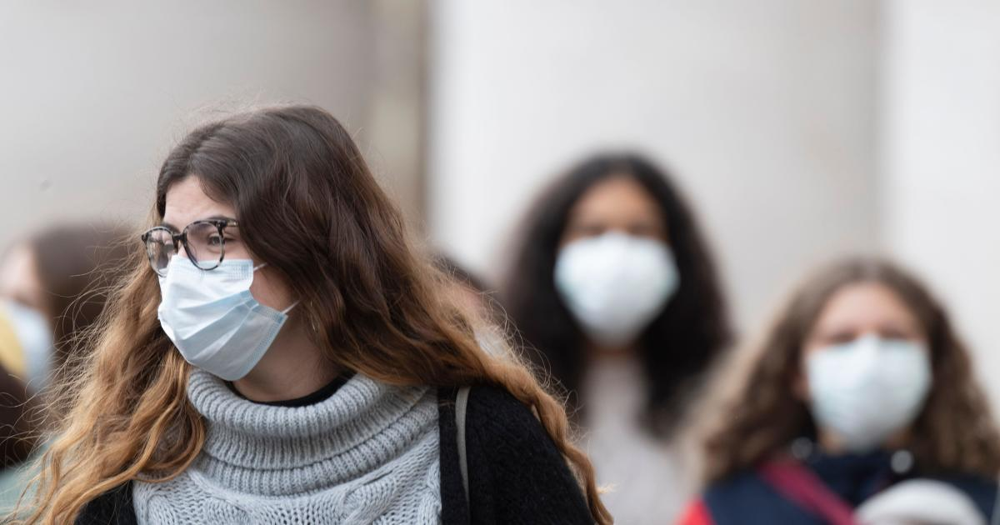



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


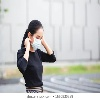



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


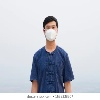



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


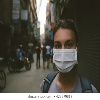



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


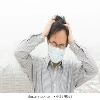



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


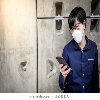



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


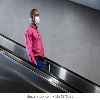



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


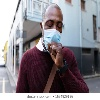



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


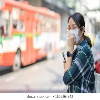



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


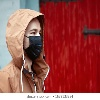



The person is wearing a mask. 

1/1 [==============================] - 0s 37ms/step


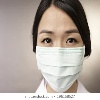



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


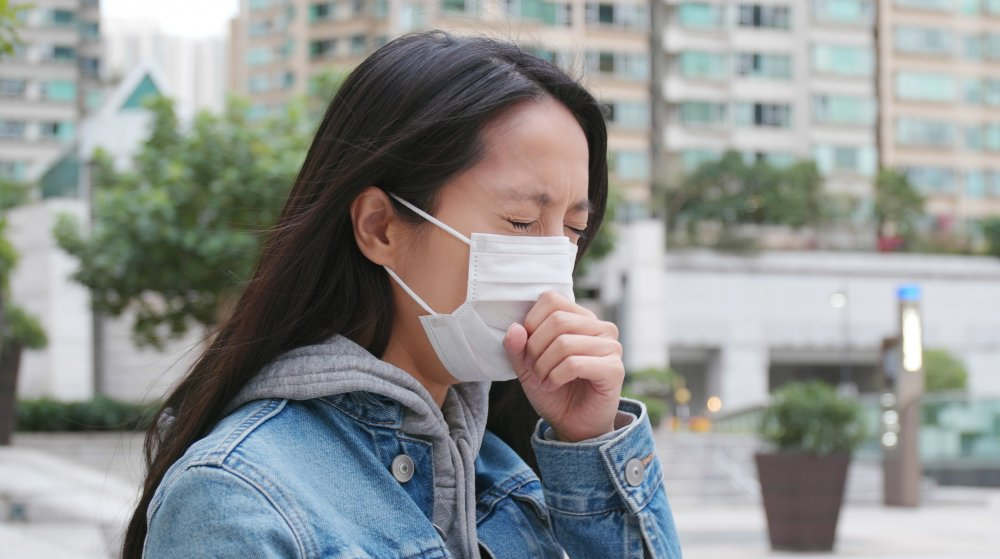



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


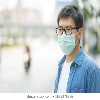



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


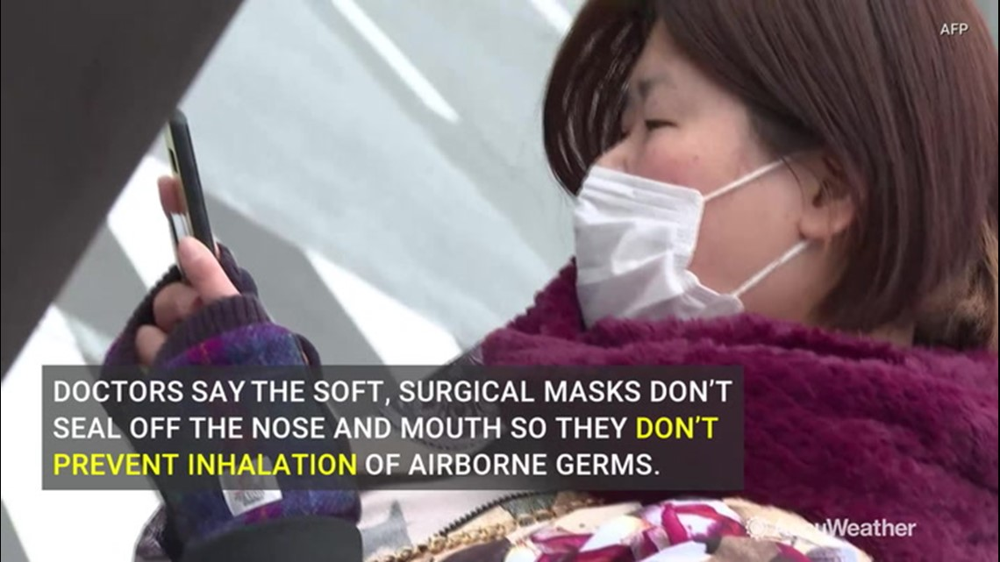



The person is wearing a mask. 

1/1 [==============================] - 0s 36ms/step


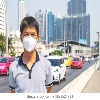



The person is wearing a mask. 

1/1 [==============================] - 0s 39ms/step


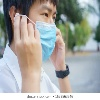



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


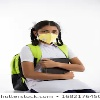



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


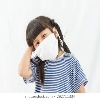



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


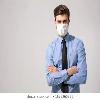



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


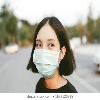



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


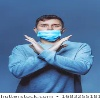



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


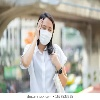



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


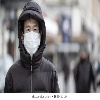



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


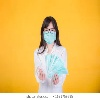



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


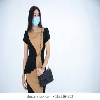



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


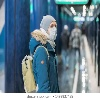



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


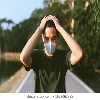



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


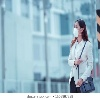



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


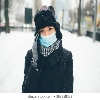



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


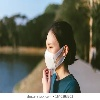



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


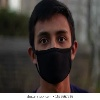



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


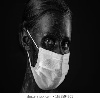



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


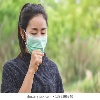



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


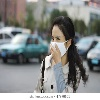



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


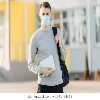



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


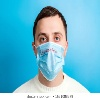



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


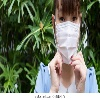



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


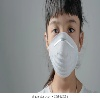



The person is wearing a mask. 

1/1 [==============================] - 0s 40ms/step


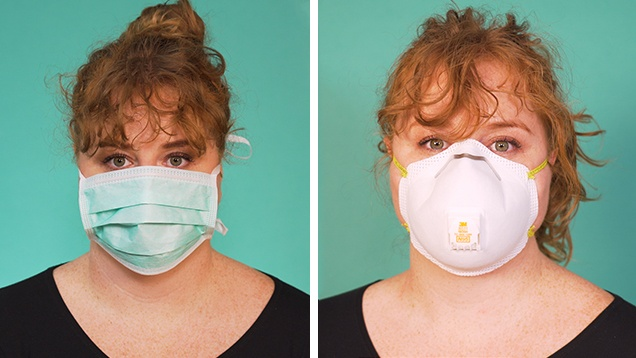



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


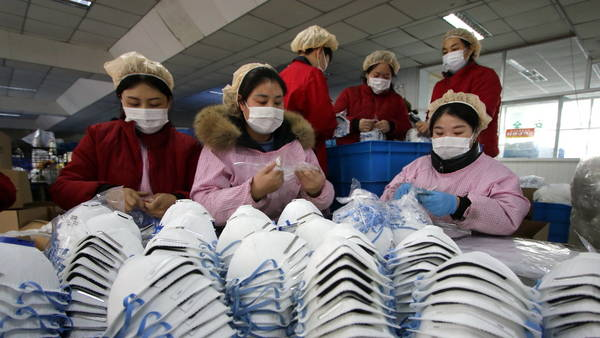



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


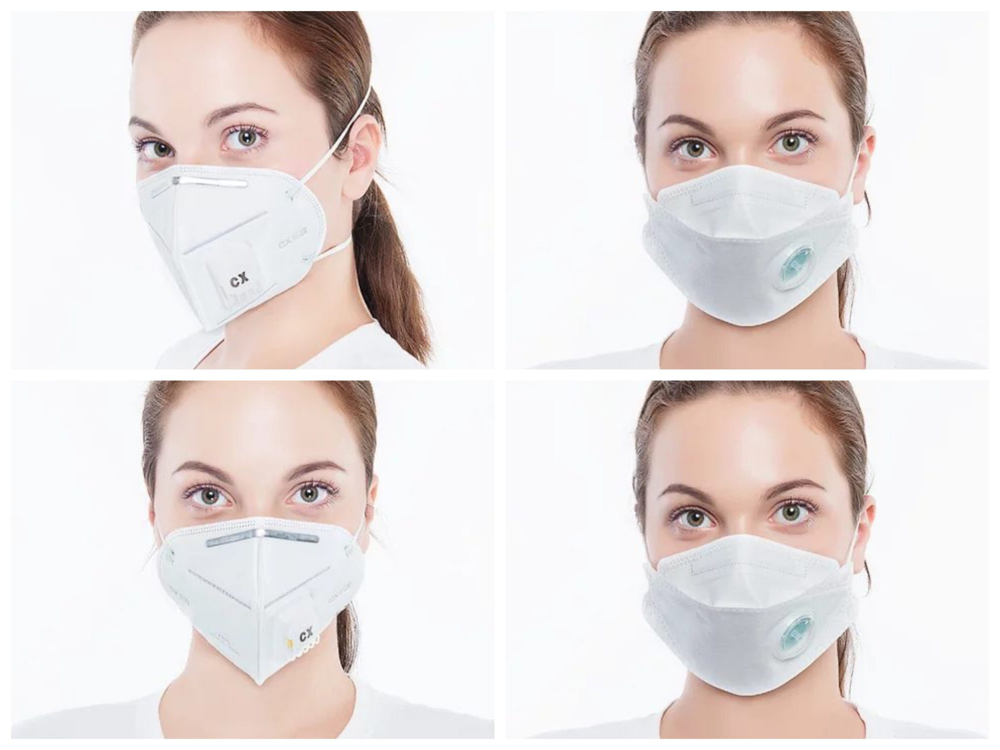



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


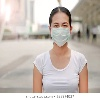



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


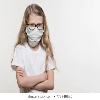



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


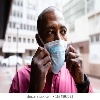



The person is wearing a mask. 

1/1 [==============================] - 0s 26ms/step


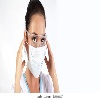



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


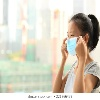



The person is not wearing a mask.



In [74]:
from IPython.display import Image, display
TGREEN =  '\033[1;37;42m'
TRED =    '\033[1;37;41m'
for filename in os.listdir(directory):
  img_directory4 = directory4 + '/' + filename
  #img_directory1 = filename
  img_pred4 = keras.utils.load_img(img_directory4, target_size = (64, 64))
  img_pred4 = keras.utils.img_to_array(img_pred4)
  img_pred4 = np.expand_dims(img_pred4, axis = 0)
  

  prediction4 = model2.predict(img_pred4)
  prediction4 = np.argmax(prediction4, axis=1)
   

  display(Image(img_directory4,width= 150, height=150))
  print("\n")
  if(prediction4 == 0):
    print(TGREEN + "The person is wearing a mask. \n")
  else:
    print(TRED + "The person is not wearing a mask.\n")


## Testing Improved Model with UnMasked Test Images and Displaying result as Masked or Unmasked

In [75]:
import os
directory5 = '/content/dataset/test/unmasked'

1/1 [==============================] - 0s 20ms/step


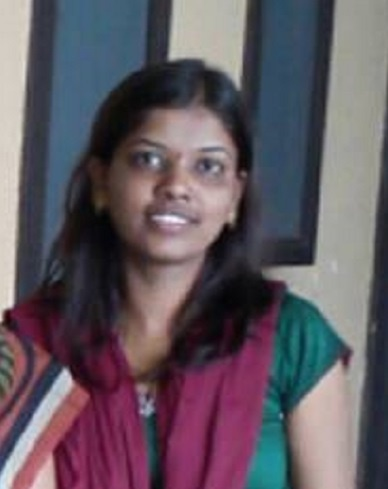



The person is not wearing a mask.

1/1 [==============================] - 0s 20ms/step


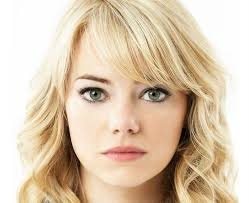



The person is not wearing a mask.

1/1 [==============================] - 0s 18ms/step


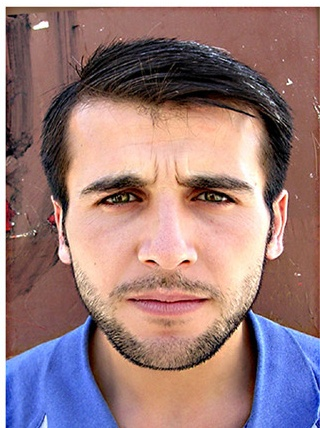



The person is not wearing a mask.

1/1 [==============================] - 0s 24ms/step


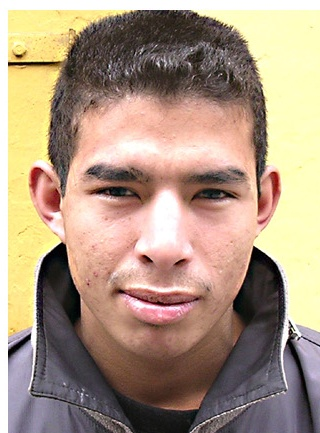



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


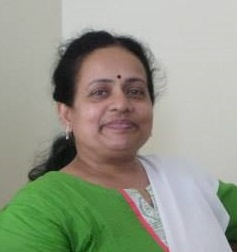



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


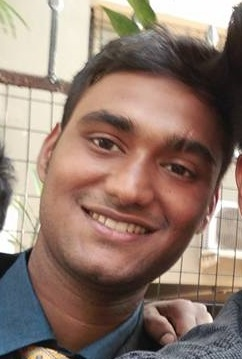



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


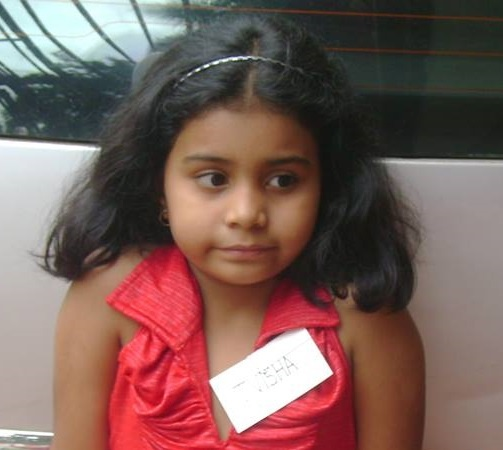



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


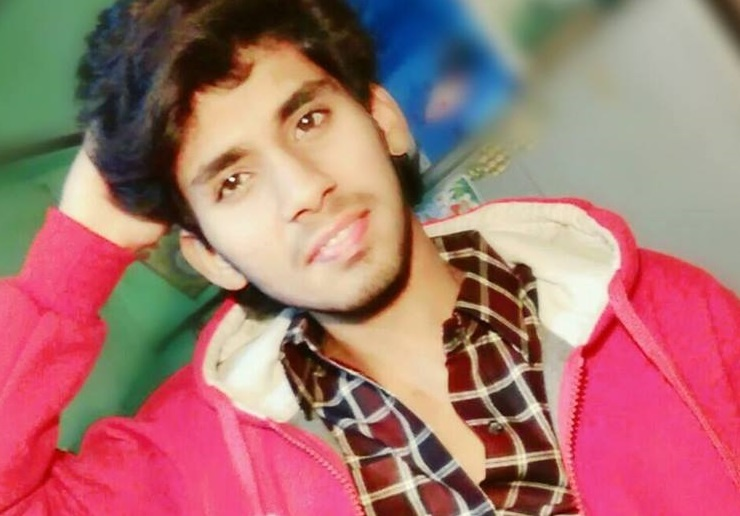



The person is wearing a mask. 

1/1 [==============================] - 0s 19ms/step


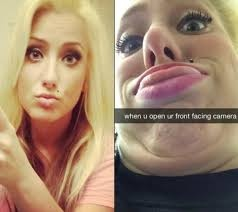



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


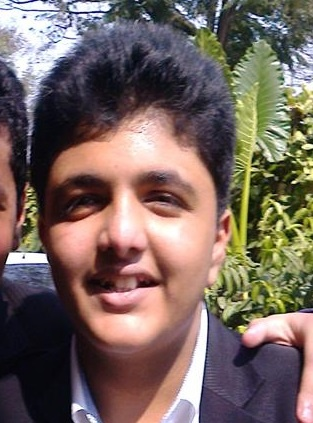



The person is not wearing a mask.

1/1 [==============================] - 0s 21ms/step


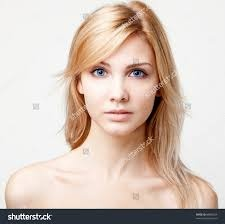



The person is not wearing a mask.

1/1 [==============================] - 0s 19ms/step


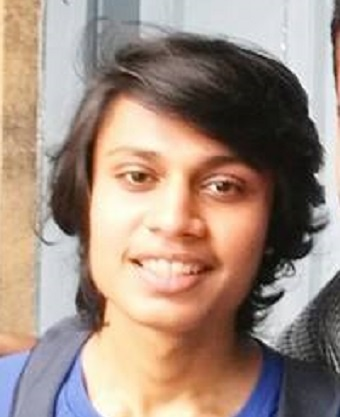



The person is not wearing a mask.

1/1 [==============================] - 0s 19ms/step


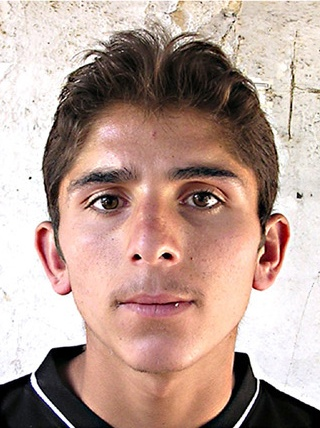



The person is not wearing a mask.

1/1 [==============================] - 0s 25ms/step


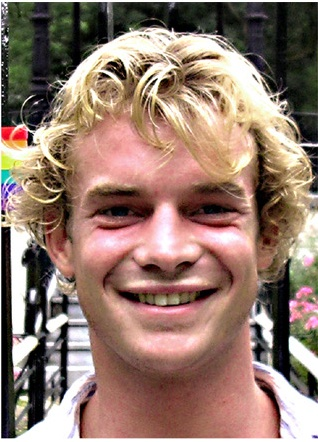



The person is not wearing a mask.

1/1 [==============================] - 0s 19ms/step


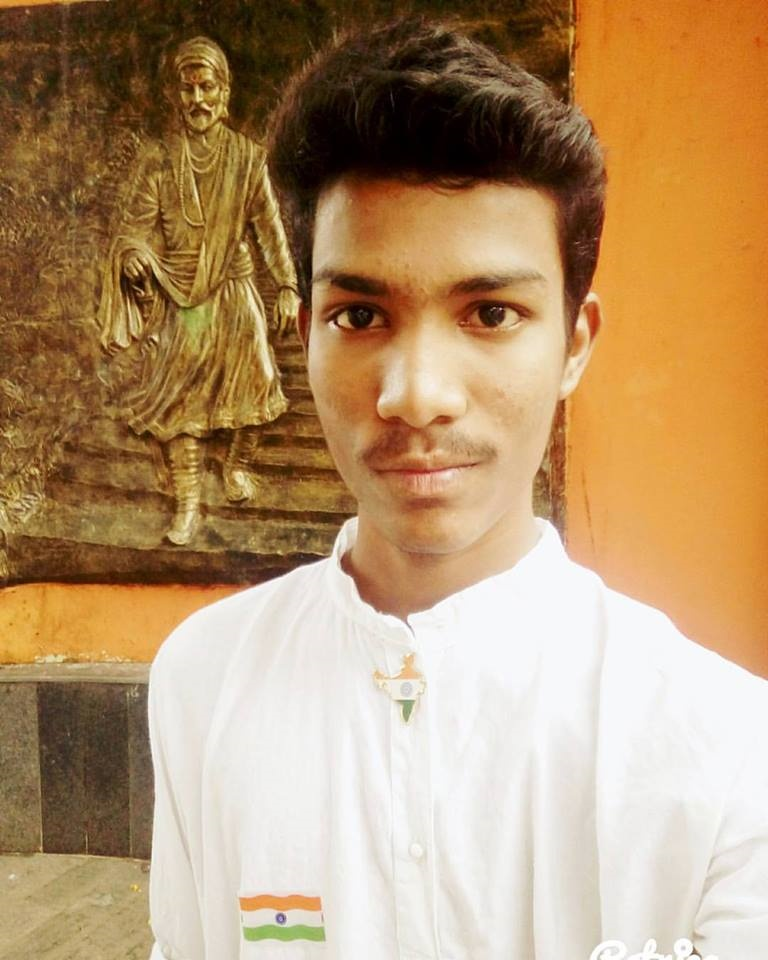



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


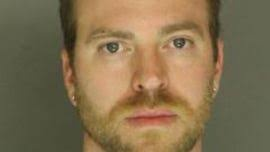



The person is not wearing a mask.

1/1 [==============================] - 0s 25ms/step


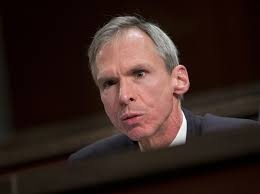



The person is wearing a mask. 

1/1 [==============================] - 0s 24ms/step


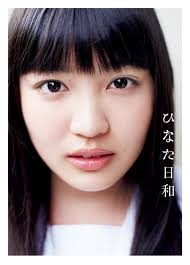



The person is not wearing a mask.

1/1 [==============================] - 0s 23ms/step


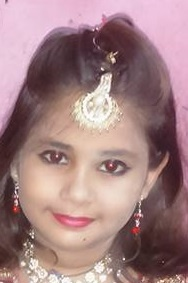



The person is not wearing a mask.

1/1 [==============================] - 0s 22ms/step


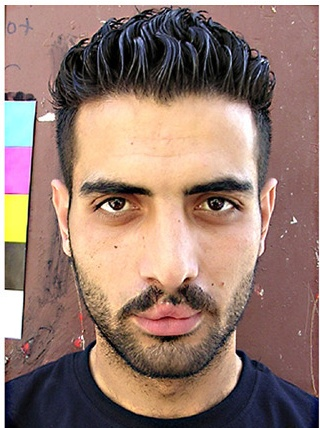



The person is not wearing a mask.

1/1 [==============================] - 0s 19ms/step


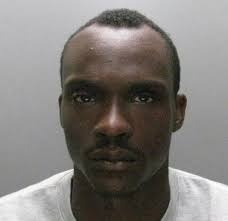



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


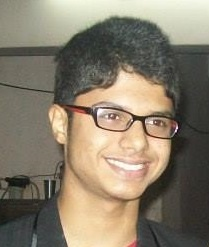



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


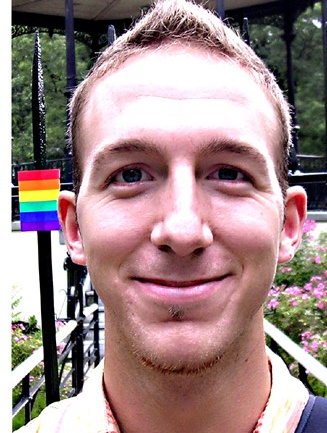



The person is not wearing a mask.

1/1 [==============================] - 0s 40ms/step


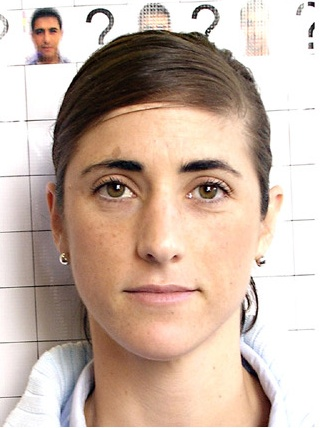



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


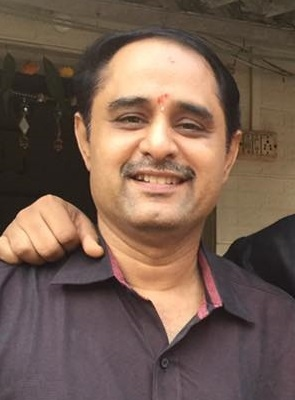



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


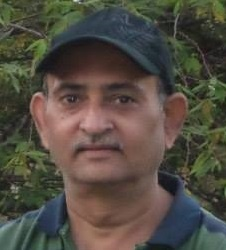



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


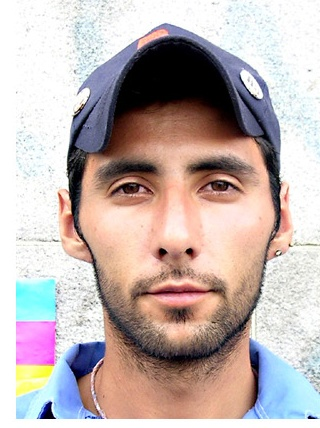



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


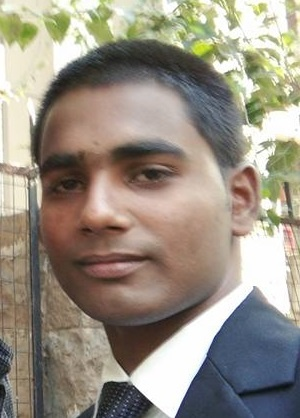



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


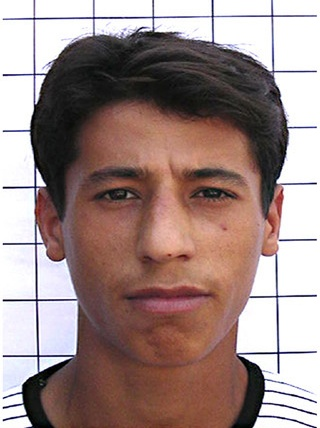



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


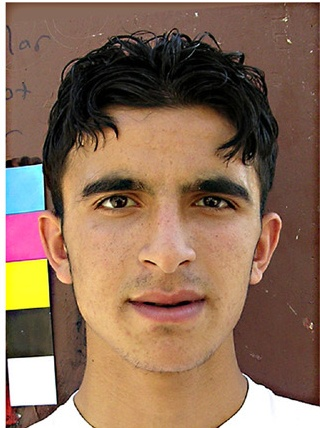



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


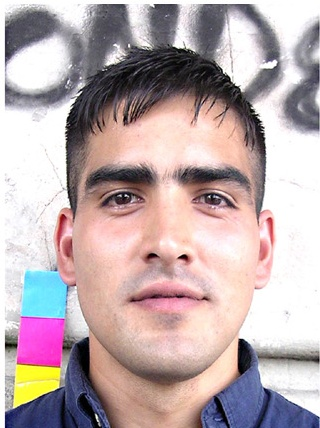



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


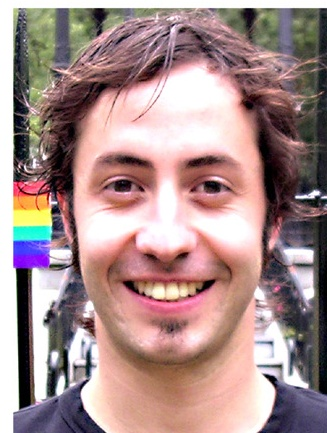



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


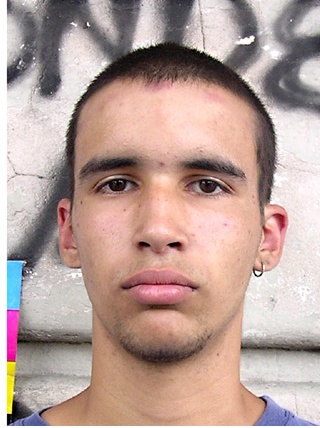



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


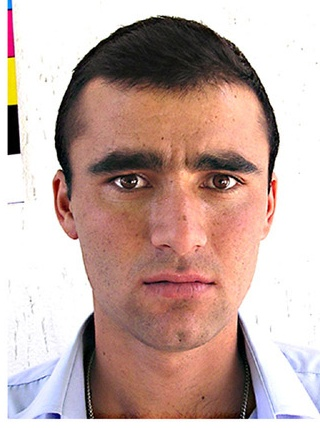



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


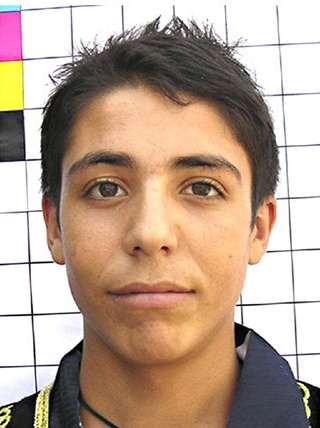



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


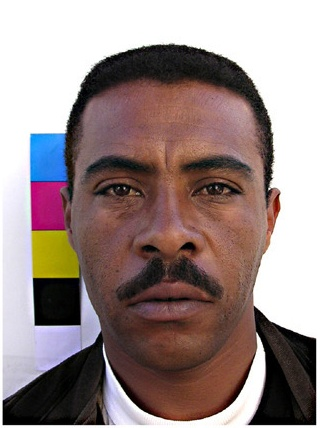



The person is not wearing a mask.

1/1 [==============================] - 0s 35ms/step


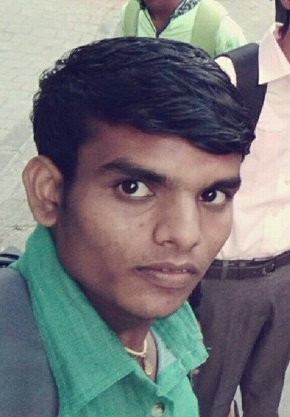



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


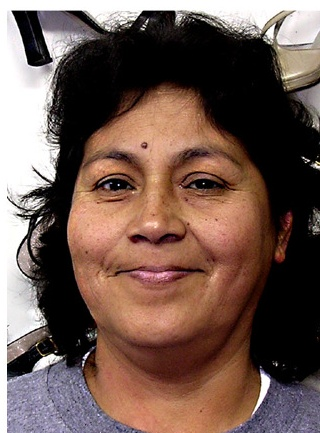



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


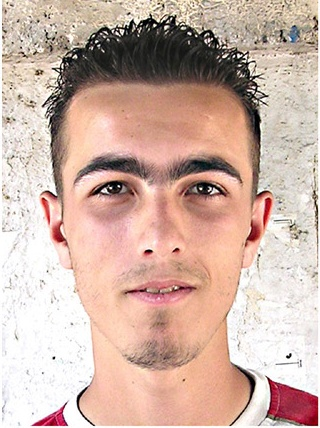



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


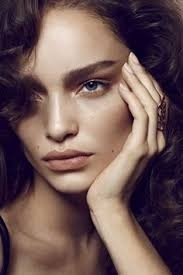



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


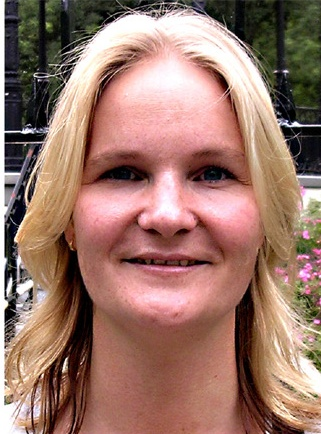



The person is not wearing a mask.

1/1 [==============================] - 0s 48ms/step


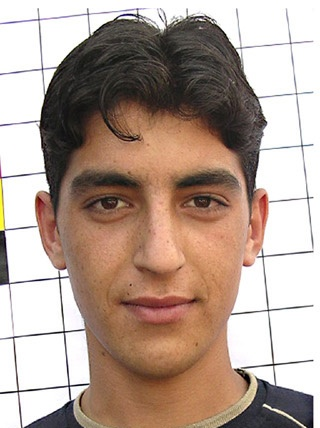



The person is not wearing a mask.

1/1 [==============================] - 0s 68ms/step


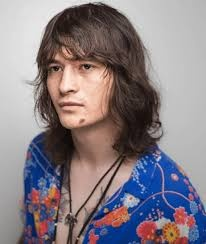



The person is not wearing a mask.

1/1 [==============================] - 0s 50ms/step


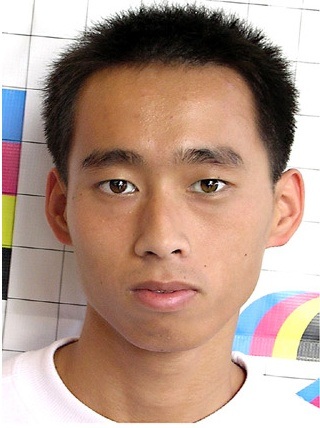



The person is not wearing a mask.

1/1 [==============================] - 0s 86ms/step


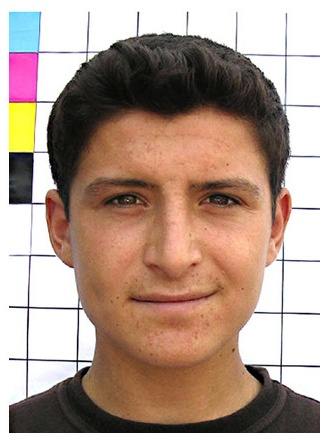



The person is not wearing a mask.

1/1 [==============================] - 0s 67ms/step


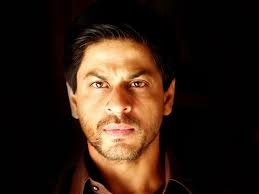



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


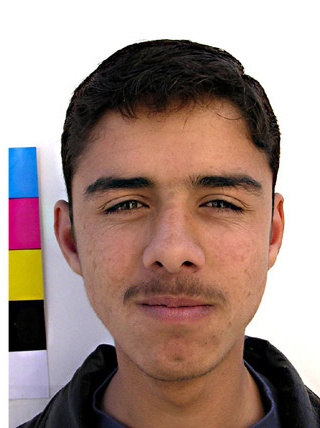



The person is not wearing a mask.

1/1 [==============================] - 0s 47ms/step


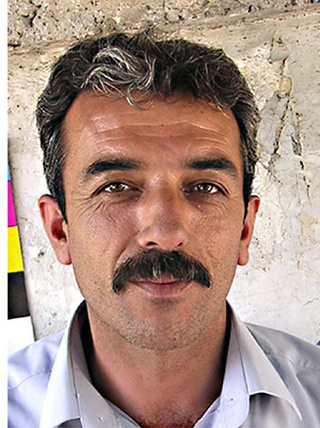



The person is not wearing a mask.

1/1 [==============================] - 0s 84ms/step


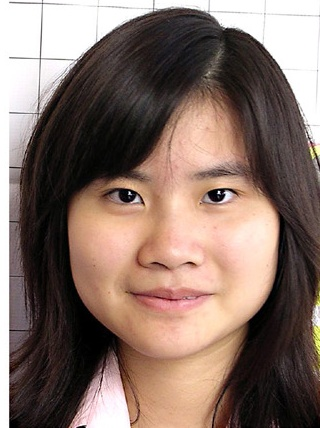



The person is not wearing a mask.

1/1 [==============================] - 0s 90ms/step


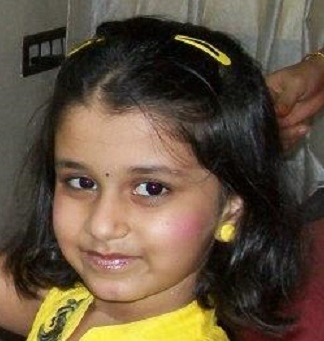



The person is not wearing a mask.

1/1 [==============================] - 0s 41ms/step


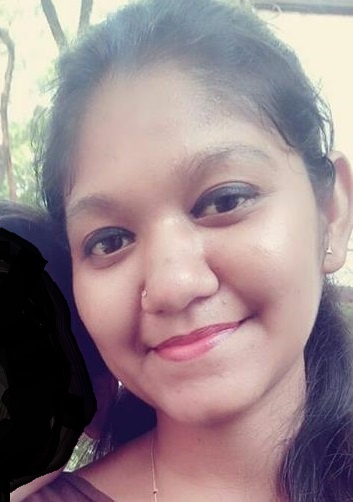



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


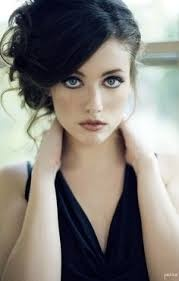



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


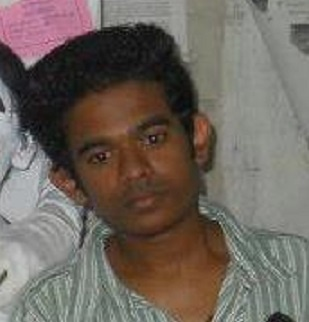



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


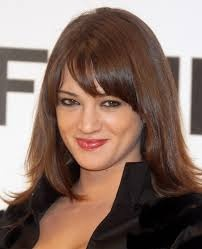



The person is not wearing a mask.

1/1 [==============================] - 0s 37ms/step


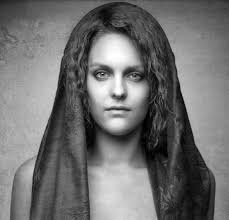



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


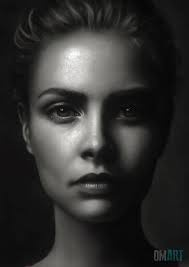



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


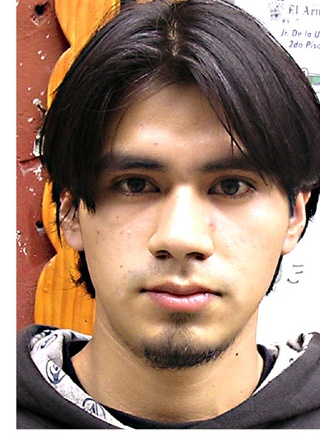



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


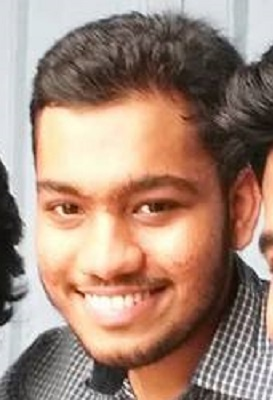



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


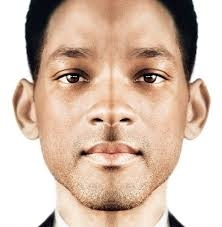



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


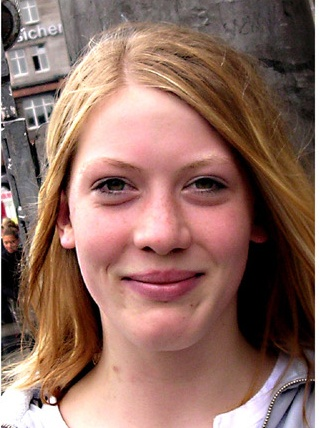



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


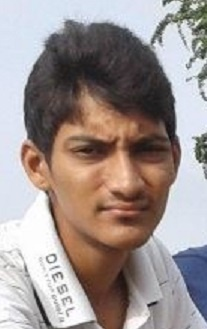



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


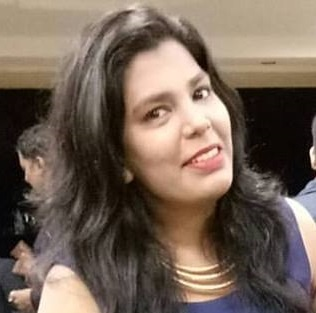



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


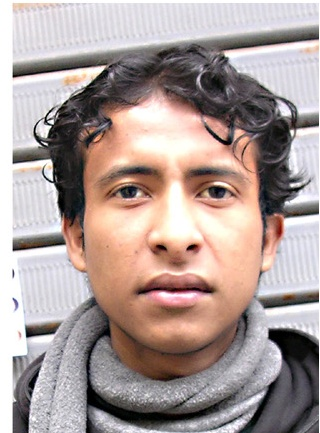



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


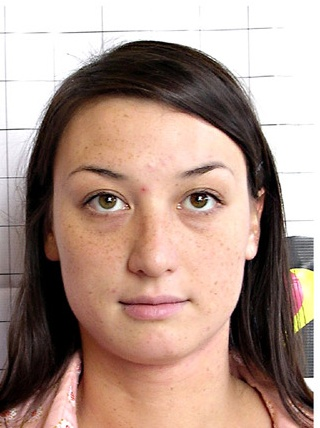



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


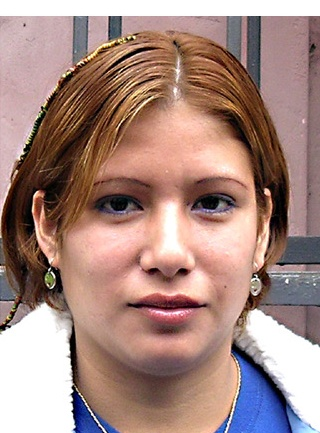



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


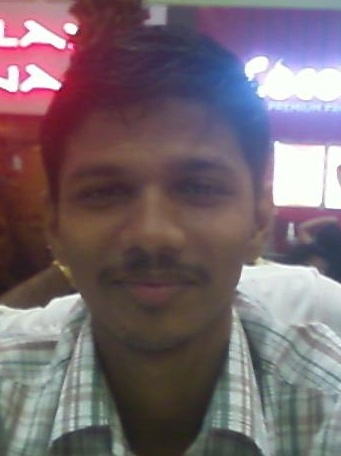



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


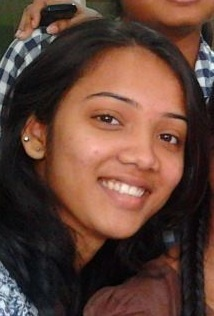



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


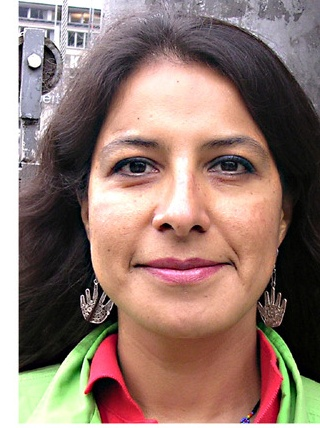



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


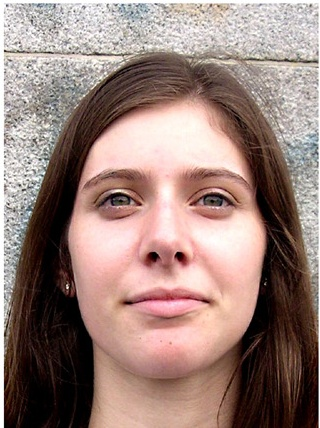



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


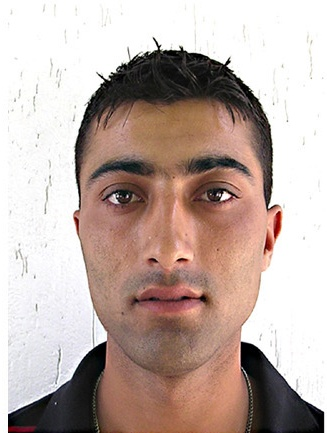



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


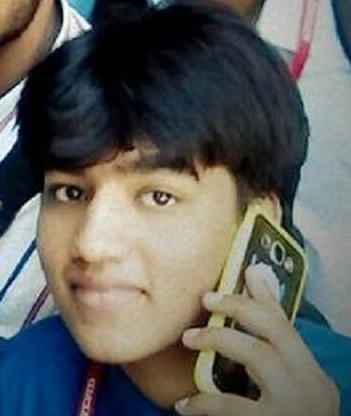



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


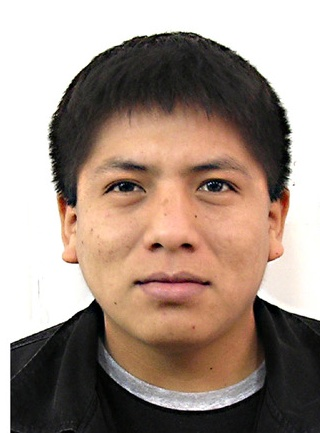



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


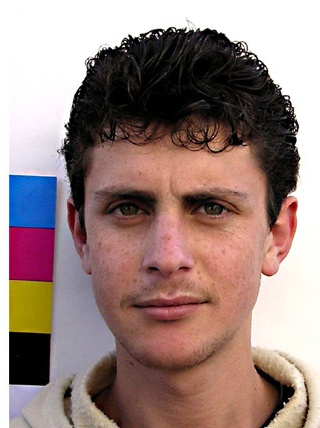



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


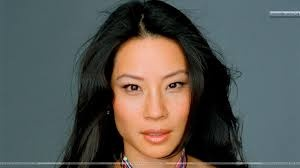



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


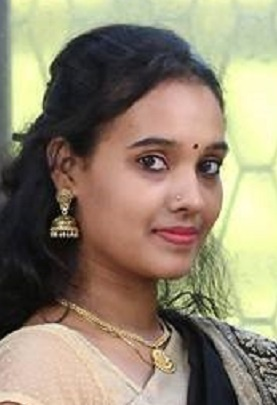



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


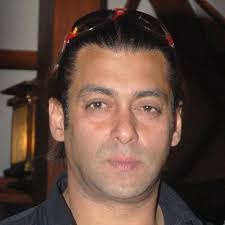



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


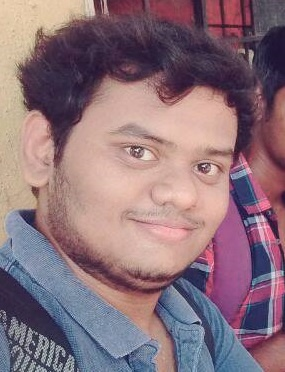



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


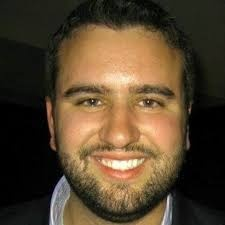



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


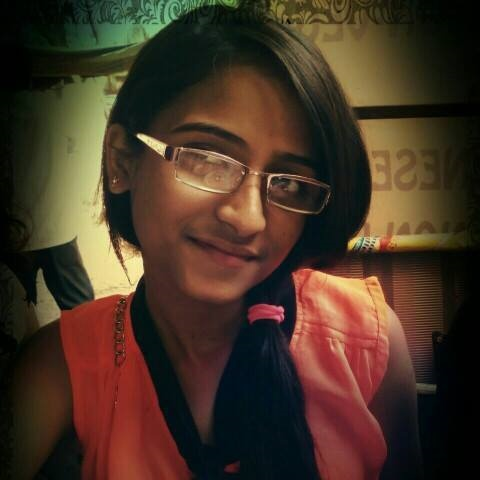



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


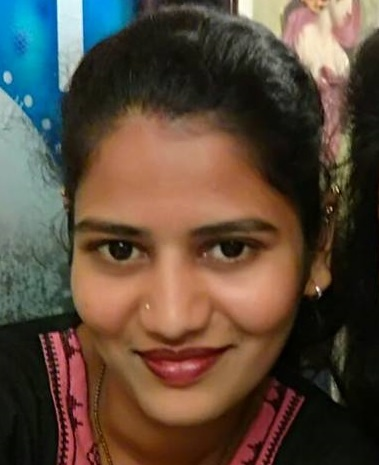



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


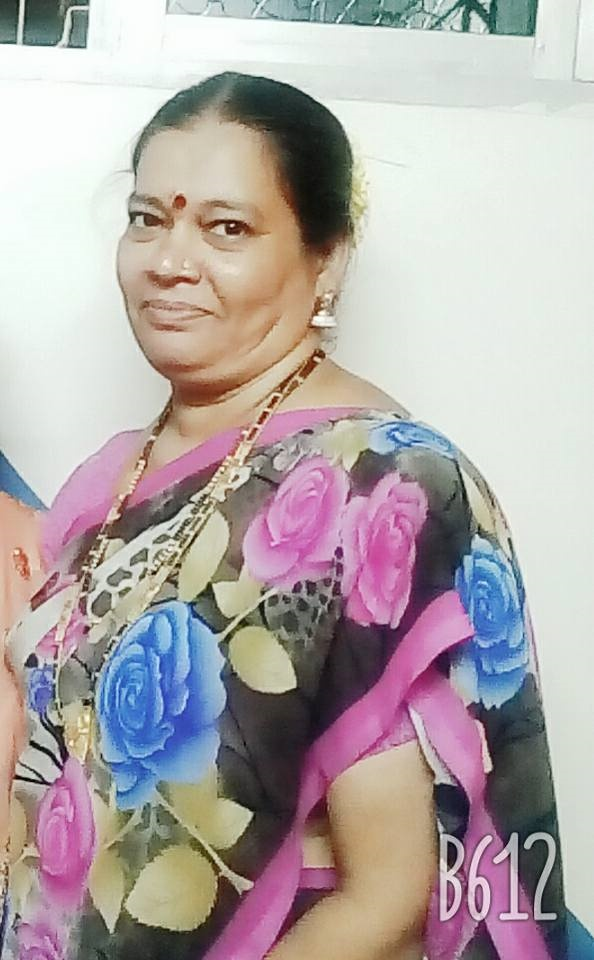



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


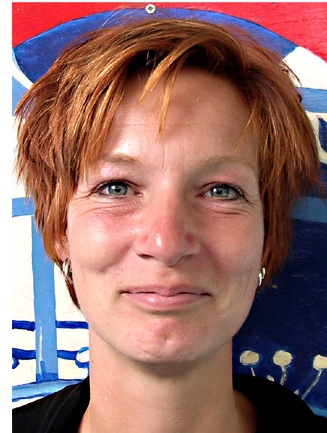



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


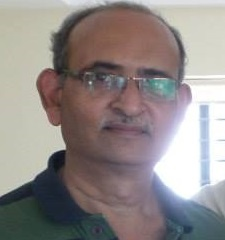



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


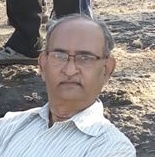



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


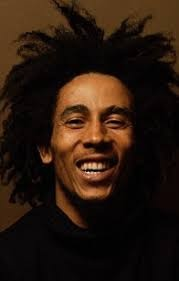



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


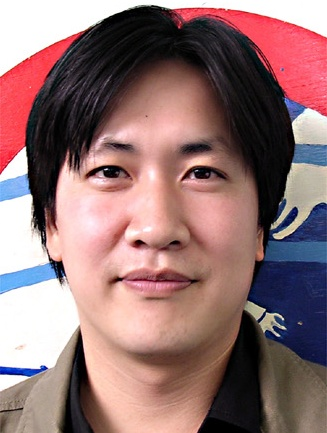



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


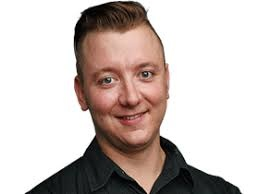



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


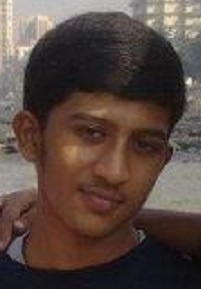



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


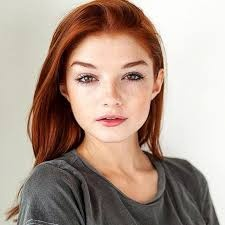



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


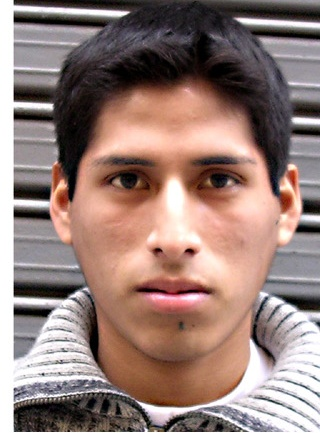



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


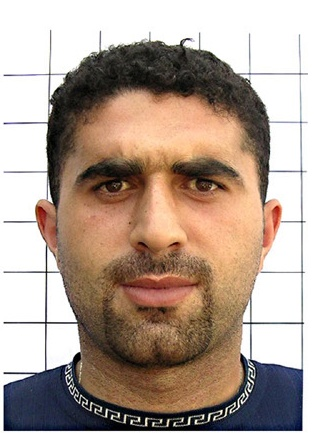



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


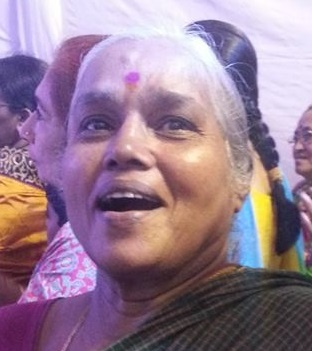



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


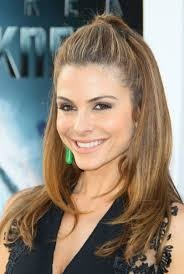



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


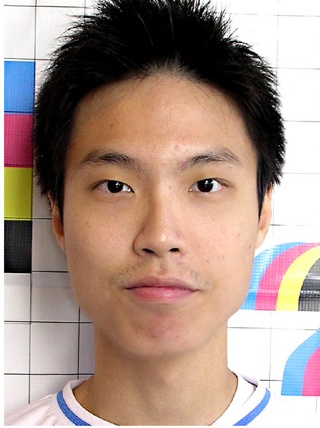



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


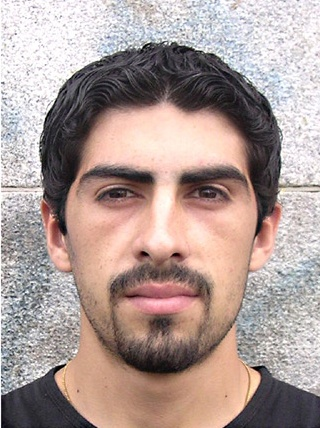



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


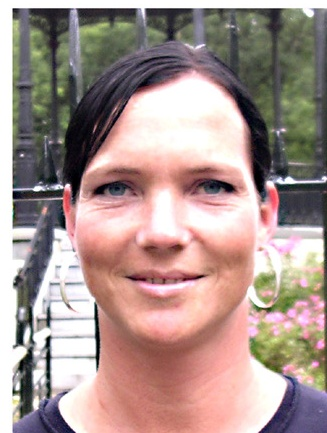



The person is not wearing a mask.

1/1 [==============================] - 0s 33ms/step


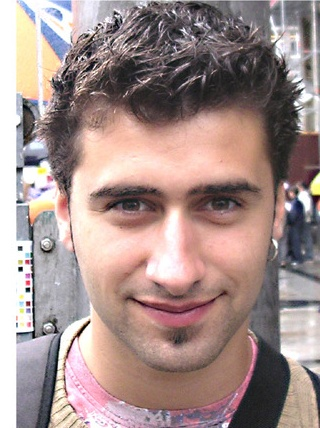



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


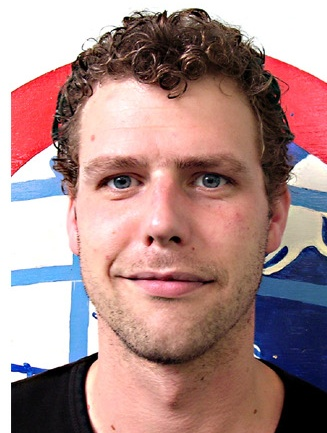



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


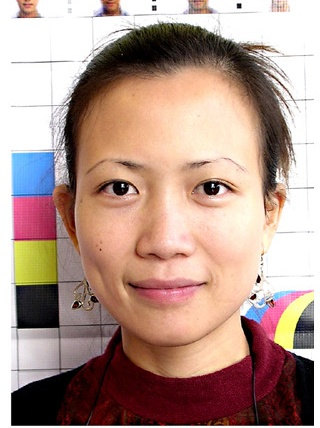



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


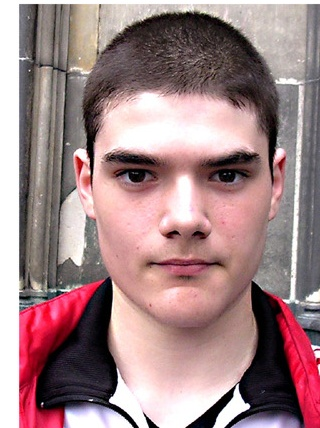



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


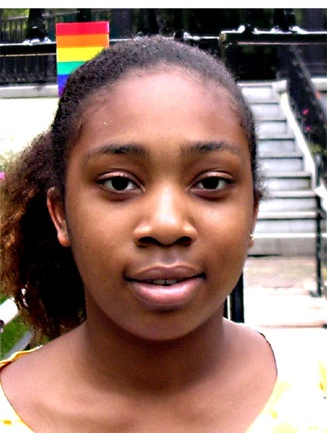



The person is not wearing a mask.

1/1 [==============================] - 0s 26ms/step


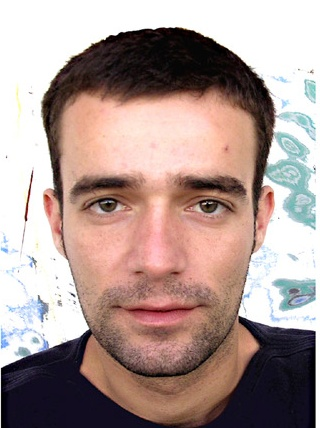



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


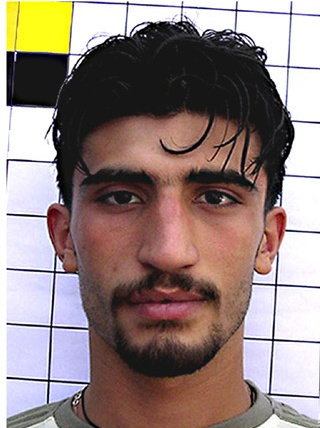



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


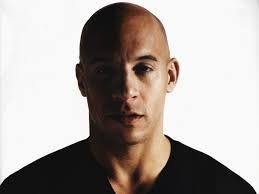



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


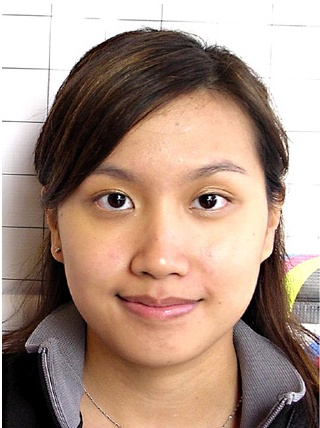



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


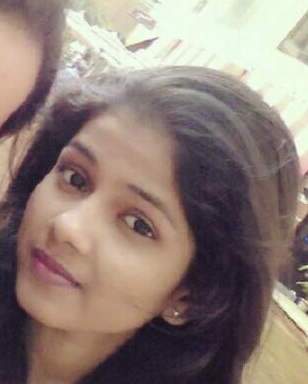



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


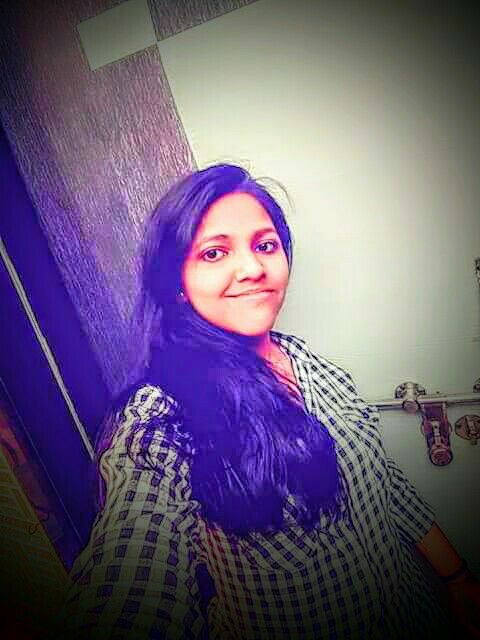



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


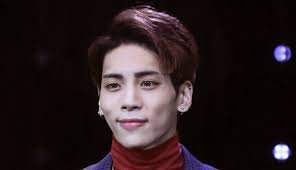



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


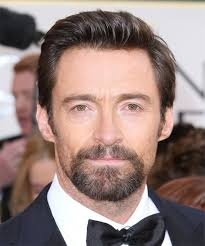



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


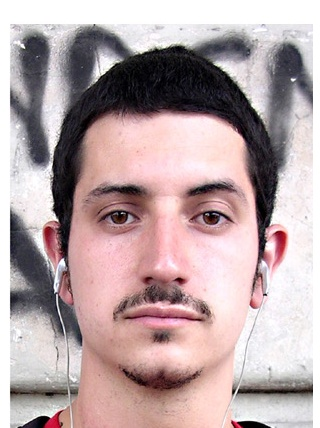



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


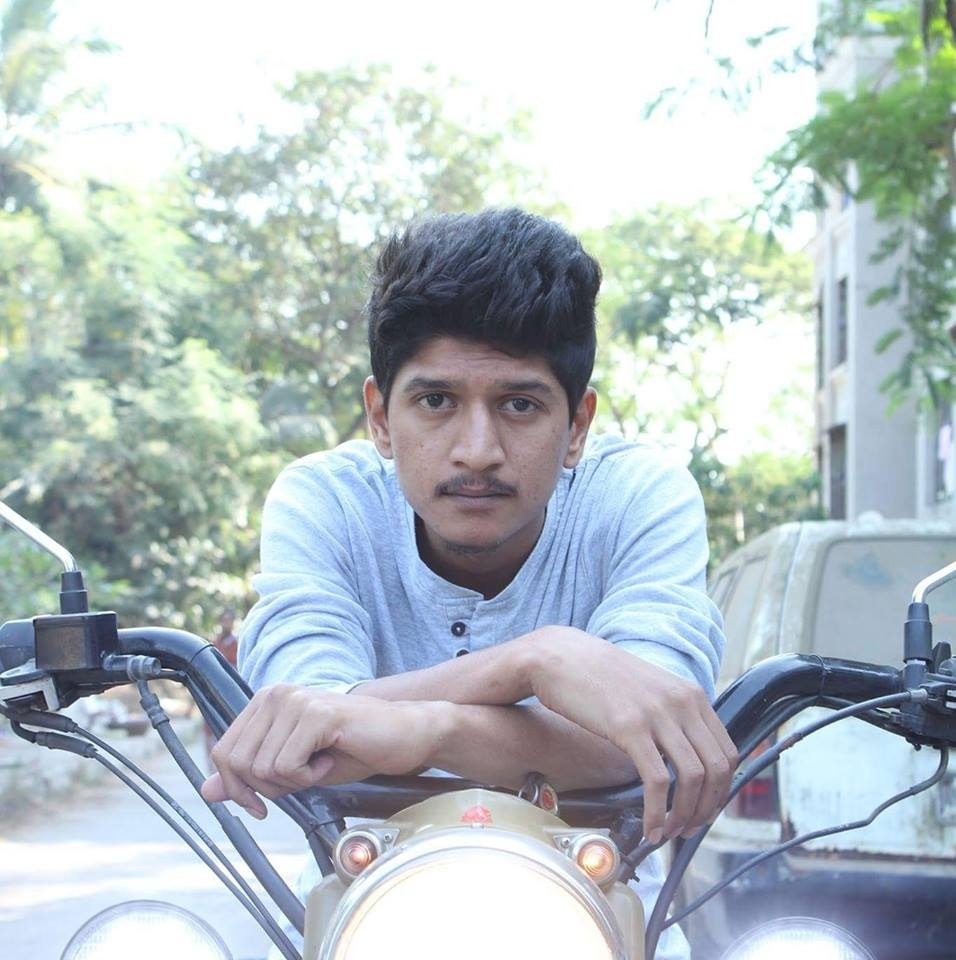



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


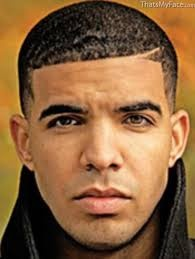



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


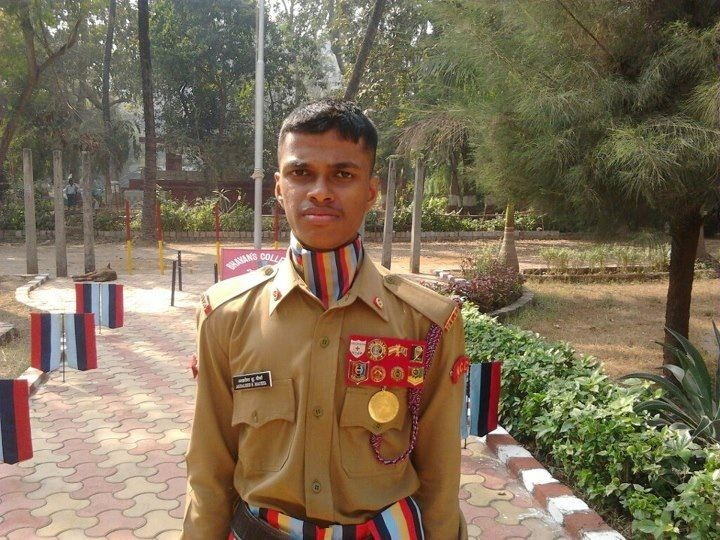



The person is wearing a mask. 

1/1 [==============================] - 0s 31ms/step


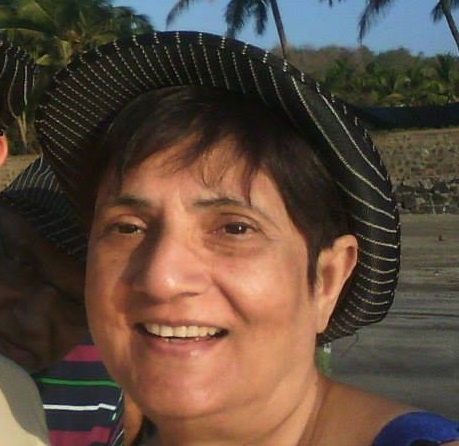



The person is not wearing a mask.

1/1 [==============================] - 0s 44ms/step


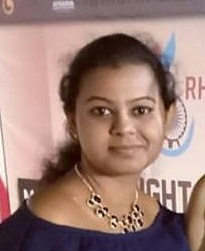



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


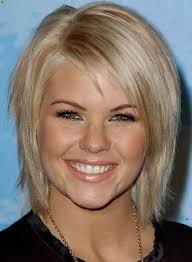



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


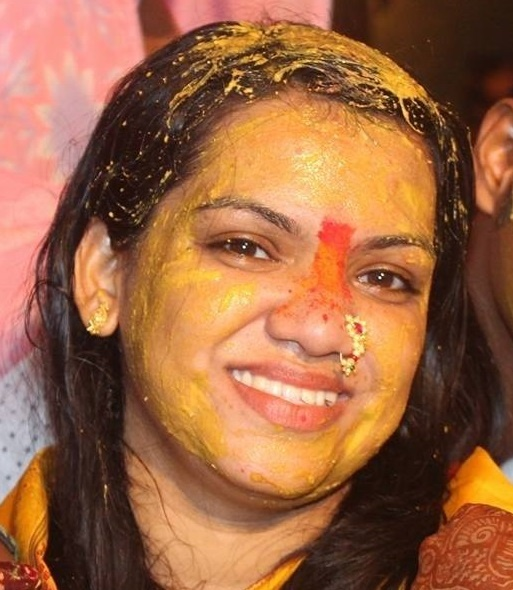



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


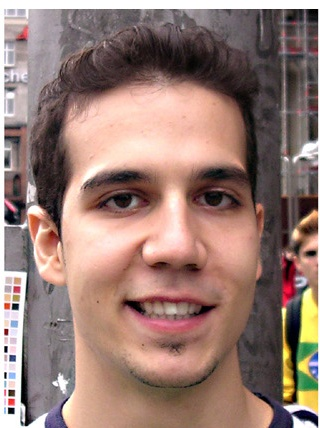



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


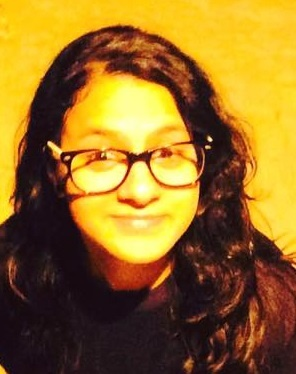



The person is wearing a mask. 

1/1 [==============================] - 0s 29ms/step


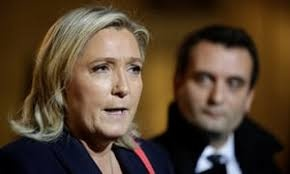



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


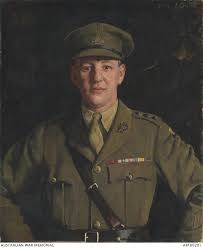



The person is wearing a mask. 

1/1 [==============================] - 0s 27ms/step


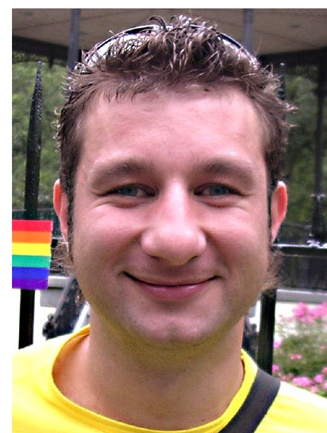



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


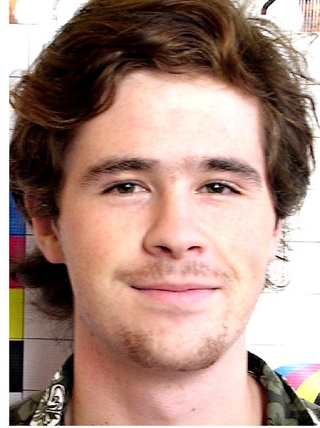



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


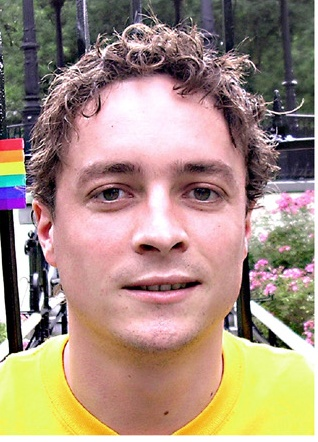



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


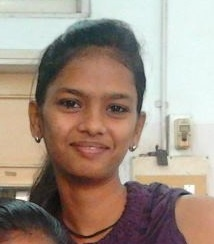



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


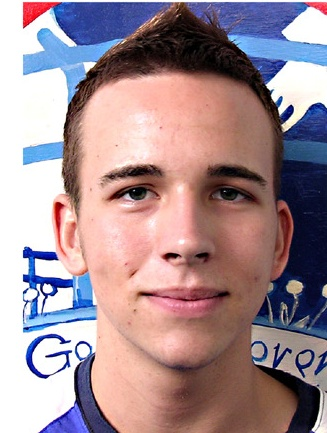



The person is not wearing a mask.

1/1 [==============================] - 0s 43ms/step


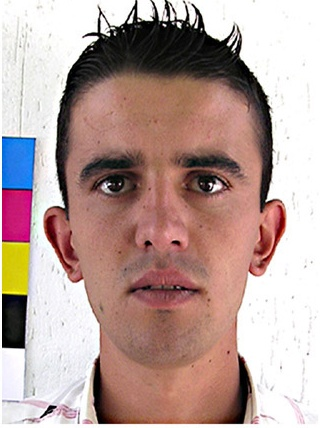



The person is not wearing a mask.

1/1 [==============================] - 0s 34ms/step


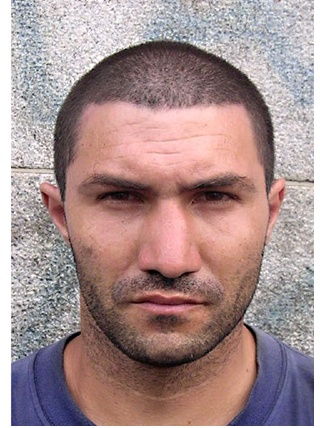



The person is not wearing a mask.

1/1 [==============================] - 0s 40ms/step


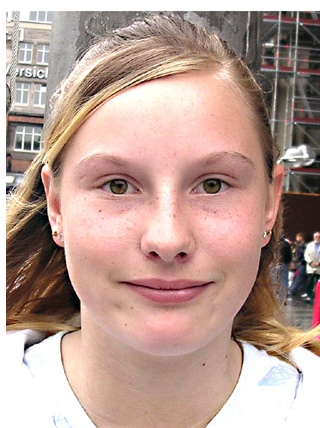



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


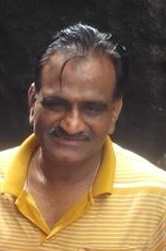



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


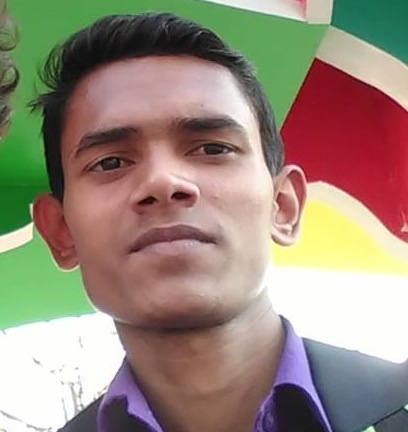



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


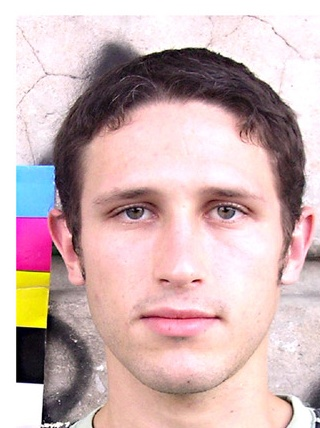



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


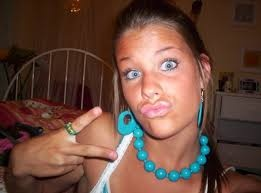



The person is wearing a mask. 

1/1 [==============================] - 0s 30ms/step


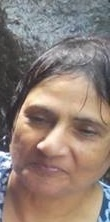



The person is not wearing a mask.

1/1 [==============================] - 0s 35ms/step


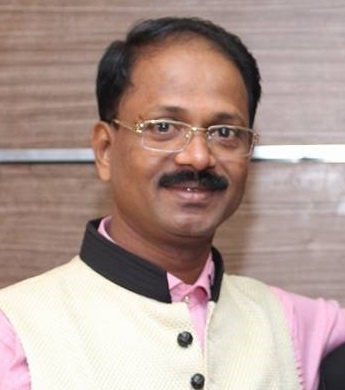



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


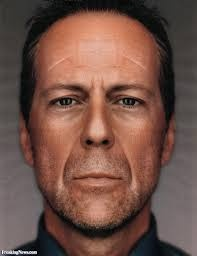



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


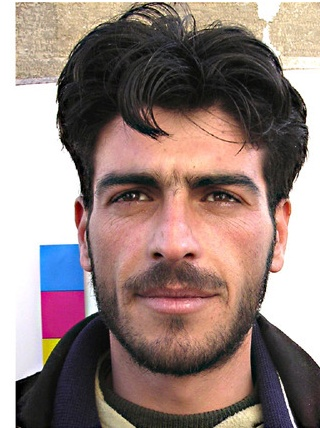



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


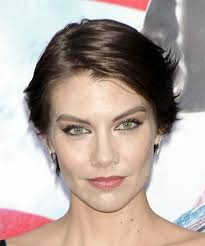



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


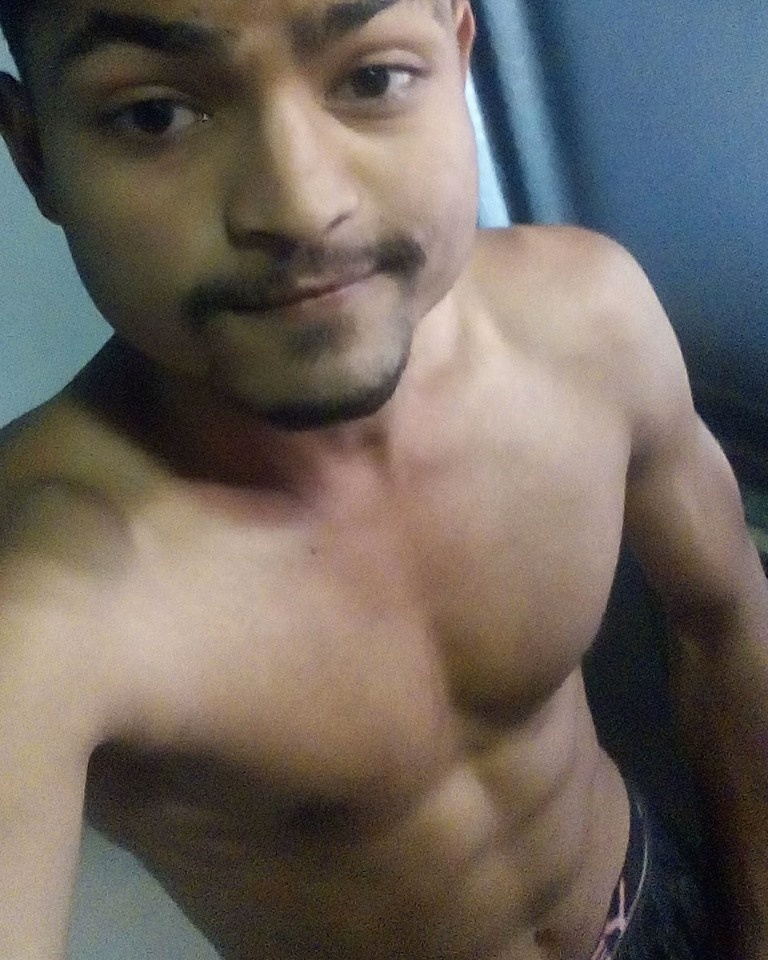



The person is not wearing a mask.

1/1 [==============================] - 0s 30ms/step


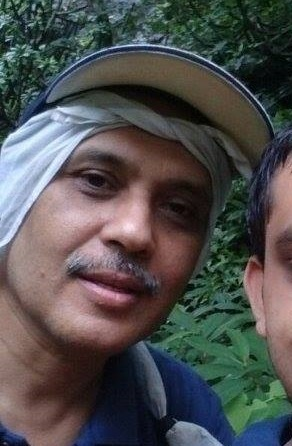



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


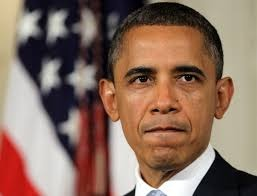



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


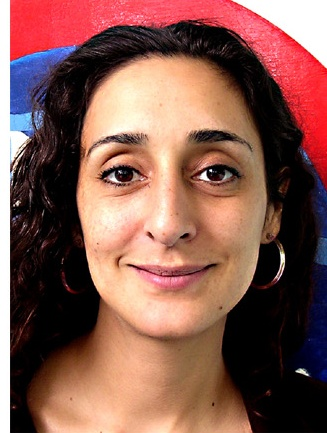



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


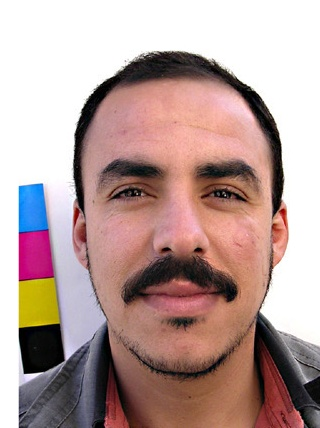



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


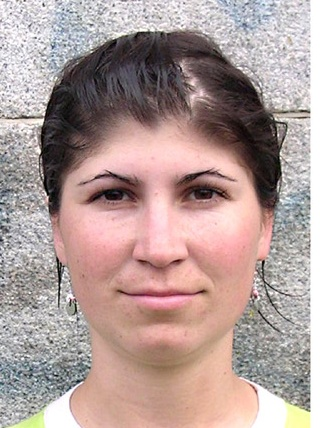



The person is not wearing a mask.

1/1 [==============================] - 0s 31ms/step


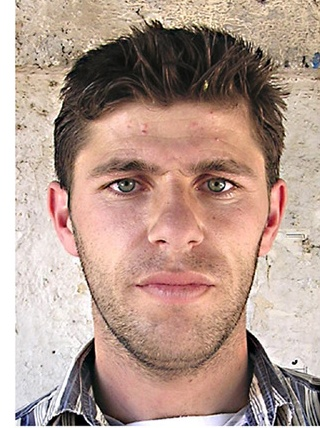



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


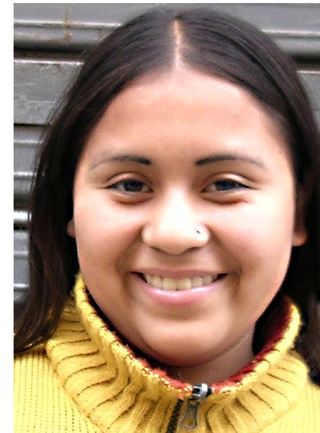



The person is not wearing a mask.

1/1 [==============================] - 0s 27ms/step


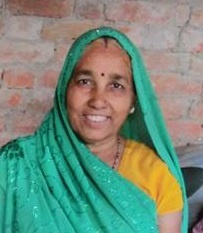



The person is wearing a mask. 

1/1 [==============================] - 0s 34ms/step


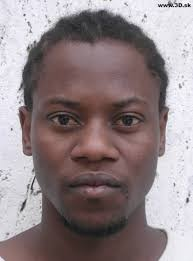



The person is not wearing a mask.

1/1 [==============================] - 0s 32ms/step


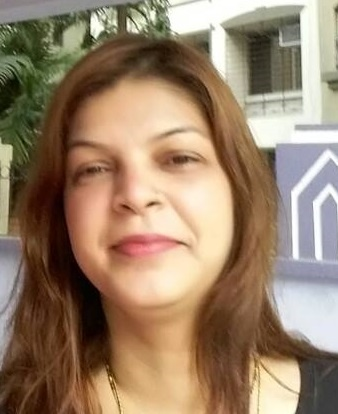



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


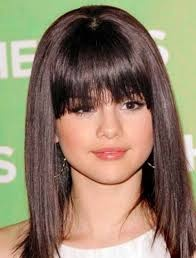



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


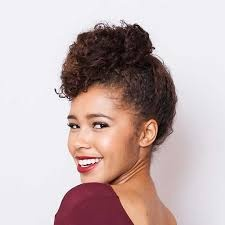



The person is not wearing a mask.

1/1 [==============================] - 0s 29ms/step


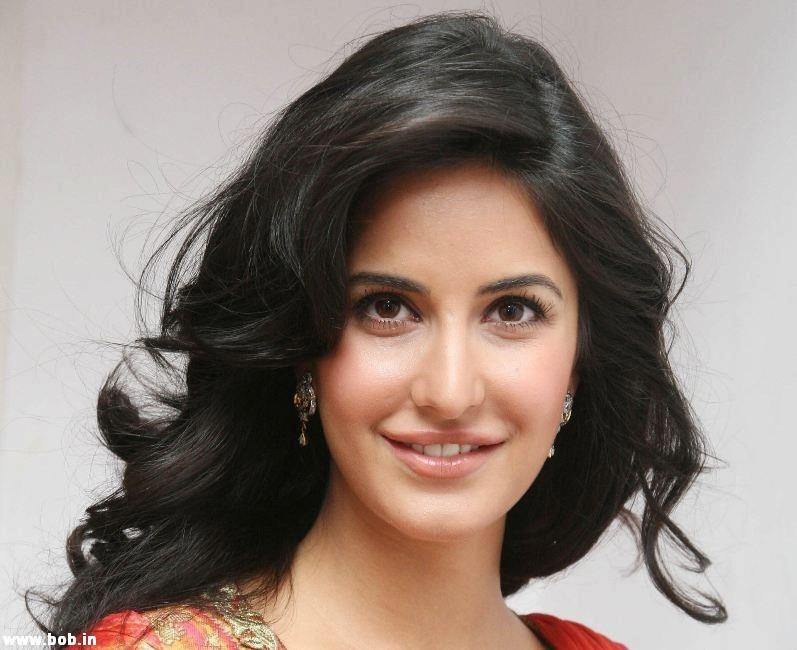



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


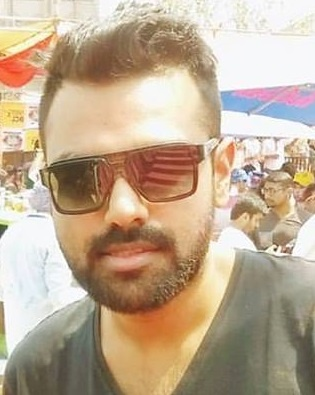



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


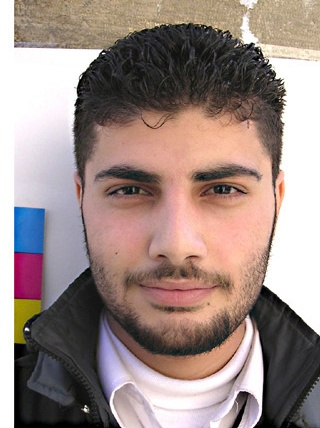



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


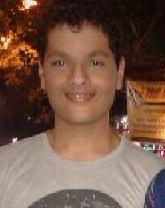



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


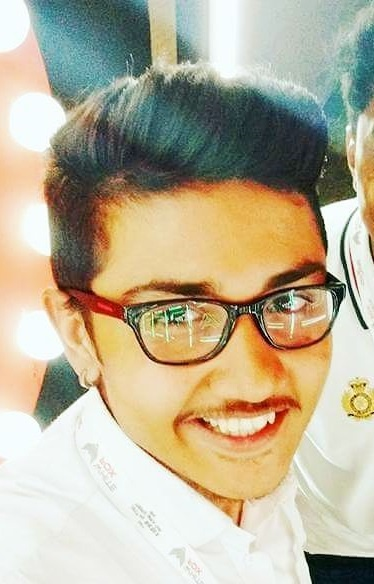



The person is wearing a mask. 

1/1 [==============================] - 0s 28ms/step


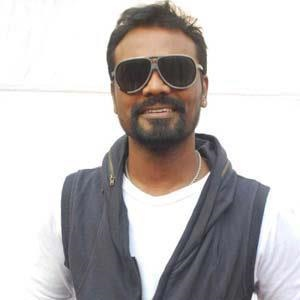



The person is wearing a mask. 

1/1 [==============================] - 0s 41ms/step


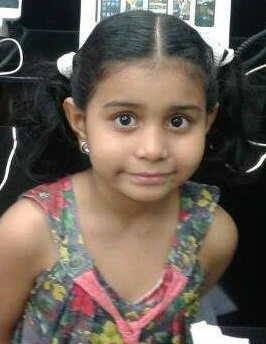



The person is not wearing a mask.

1/1 [==============================] - 0s 28ms/step


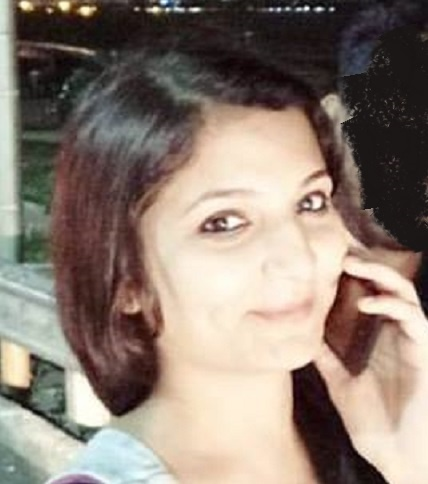



The person is wearing a mask. 

1/1 [==============================] - 0s 32ms/step


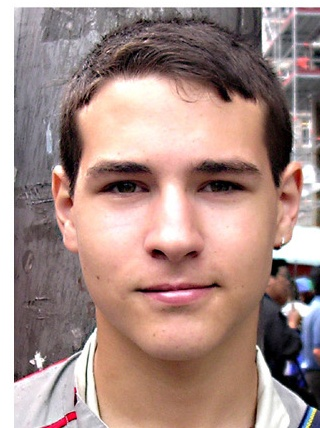



The person is not wearing a mask.



In [77]:
for filename2 in os.listdir(directory2):
  img_directory5 = directory5 + '/' + filename2
  img_pred5 = keras.utils.load_img(img_directory5, target_size = (64, 64))
  img_pred5 = keras.utils.img_to_array(img_pred5)
  img_pred5 = np.expand_dims(img_pred5, axis = 0)

  prediction5 = model2.predict(img_pred5)
  prediction5 = np.argmax(prediction5, axis=1)
  display(Image(img_directory5,width= 150, height=150))
  print("\n")
  if(prediction5 == 0):
    print(TGREEN + "The person is wearing a mask. \n")
  else:
    print(TRED + "The person is not wearing a mask.\n")
